### This notebook generates the figure that summarizes task-related activity using mean-correlation-with-single-trials (mr2 == mean-rsquared) for task-classification ----> see task_class_assignment.ipynb

In [54]:
### Load imports.
%load_ext autoreload
%autoreload 2
%matplotlib inline
%load_ext line_profiler

import os
from matplotlib import pyplot as plt
from matplotlib import gridspec
import matplotlib
import numpy as np
import time
import scipy.stats
import pickle

from collections import defaultdict

import h5py
from scipy.ndimage.filters import gaussian_filter1d
from scipy.stats import zscore

import cosmos.traces.trace_analysis_utils as utils
from cosmos.behavior.bpod_dataset import BpodDataset
from cosmos.traces.cell_plotter import CellPlotter
from cosmos.traces.cosmos_traces import CosmosTraces
import cosmos.traces.clustering_utils as cu
import cosmos.params.trace_analyze_params as params 

matplotlib.rcParams.update({'xtick.major.pad': '2'})
matplotlib.rcParams.update({'ytick.major.pad': '2'})
matplotlib.rcParams.update({'font.size': 8})
matplotlib.rcParams['pdf.fonttype'] = 42 # truetype
matplotlib.rcParams['ps.fonttype'] = 42

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [55]:
### Set up filepaths.
workstation = 'analysis2' #'analysis2'

if workstation == 'analysis2':
    base_dir = '/home/izkula/Dropbox/'
elif workstation == 'cosmosdata':
    base_dir = '/home/user/Dropbox'
    
data_dir = base_dir + '/cosmos_data/'
general_plots_save_dir = base_dir + '/cosmos/trace_analysis/'
fig_save_dir = base_dir + '/cosmos/fig_plots/fig7/'
bpod_dir = base_dir + '/cosmos_data/behavior/'
clustering_dir = base_dir + '/cosmos_data/clustering_results/'
cluster_figs_dir = base_dir + '/cosmos/fig_plots/fig7/'

    
# if not os.path.isdir(fig_save_dir):
os.makedirs(fig_save_dir, exist_ok=True)

In [56]:
# Which datasets to include
# datasets = [7, 19, 18, 11, 22, 23, 24, 25] #[18, 19] #[7, 11, 18, 19]
# datasets = [16] #[16] #[35] #[7, 11, 18, 19] #[18, 19] #[7, 11, 18, 19]

# datasets = [7, 19, 18, 11, 22, 23, 24, 25] ### Use this to compare multiple days
datasets = [7, 19, 18, 11] ### Use this if you just want to look at basic datasets.

datasets = [7, 11, 18, 19, 35]

mouse_colors = utils.get_colors(4, plt.cm.spectral);


In [57]:
%pdb

Automatic pdb calling has been turned ON


In [ ]:
# Load all of the datasets (each their own class).
allCT = []
for dataset_id in datasets:
    dataset = params.DATASETS[dataset_id]
    print(dataset['date'], dataset['name'])
    dataset['data_root'] = data_dir
    dataset['fig_save_dir'] = general_plots_save_dir
    dataset['behavior_dir'] = bpod_dir
    
    startt = time.time()
    CT = CosmosTraces(dataset, do_region_plots=True)
    allCT.append(CT)
    print('Elapsed time: '+str(time.time() - startt))

20180401 cux2ai148m72_COSMOSTrainMultiBlockGNG_1
(1/3) Loading trace data.
(2/3) Loading behavior data.
While loading bpod, enforcing that ntrials is:211
lick rates bin size: 0.034
lick rates bin size: 0.034
lick rates bin size: 0.034
lick rates bin size: 0.034
Saving to:  /home/izkula/Dropbox//cosmos/trace_analysis/20180401/cux2ai148m72_COSMOSTrainMultiBlockGNG_1/polar_pre-reward.pdf
Saving to:  /home/izkula/Dropbox//cosmos/trace_analysis/20180401/cux2ai148m72_COSMOSTrainMultiBlockGNG_1/polar_post-reward.pdf
Saving to:  /home/izkula/Dropbox//cosmos/trace_analysis/20180401/cux2ai148m72_COSMOSTrainMultiBlockGNG_1/licks.pdf
Saving to:  /home/izkula/Dropbox//cosmos/trace_analysis/20180401/cux2ai148m72_COSMOSTrainMultiBlockGNG_1/success_rate.pdf
LED trials: 212
Processing traces.
[-34.99899927 423.99899927]
[297.73913811 301.26086189]
Elapsed time: 32.19693732261658
20180420 cux2ai148m943_COSMOSTrainMultiBlockGNG_1
(1/3) Loading trace data.
(2/3) Loading behavior data.
While loading bpod, 

MemoryError: 

> /home/izkula/src/COSMOS/cosmos/traces/cosmos_traces.py(397)_load_traces()
    395                 _, self.atlas_annotations, _ = reg.load_atlas()
    396                 self.atlas_tform = reg.fit_atlas_transform(self.img_coords,
--> 397                                                            atlas_coords)
    398 
    399     def _load_behavior(self, behavior_path, plot=True, ntrials=None):



In [10]:
# 0) Load the clustered data.
dataset_id = 19 #16 #11
CT_ind = int(np.where(np.array(datasets)==dataset_id)[0])

n_components = 40
sets = [#{'method':'nmf', 'protocol':'4way', 'randseed':1, 'n_components':n_components, 'l1':0.0},
        {'method':'nmf', 'protocol':'full', 'randseed':1, 'n_components':n_components, 'l1':0.0},
        {'method':'classify', 'protocol':'mr2', 'randseed':'', 'n_components':'', 'l1':''},
    ]
all_nmf = cu.load_clustering_results(dataset_id, sets, clustering_dir, protocol_as_key=True)
    
clust_fig_dir = os.path.join(cluster_figs_dir, 'avg_plots_{}'.format(n_components), str(dataset_id))
os.makedirs(clust_fig_dir, exist_ok=True)
print('Save to:')
print(clust_fig_dir)

Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt19_r1_n40_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt19_r_n_l.pkl
Save to:
/home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/19


In [11]:
### Load clustered data.
protocol = 'mr2' # '4way'

### The below requires having loaded the CT datastructure.
fps = CT.fps
if protocol == '4way':
    rates = gaussian_filter1d(allCT[CT_ind].St, 1.5, axis=1, mode='constant')
    event_frames = allCT[CT_ind].event_frames
    data = cu.concatenate_trial_type_avgs(all_nmf['4way']['trial_sets'], rates, 
                                          do_plot=False)
elif protocol == '2way':
    rates = gaussian_filter1d(allCT[CT_ind].St, 1.5, axis=1, mode='constant')
    do_super_clust = True
    if not do_load:
        data = cu.concatenate_trial_type_avgs(all_nmf['2way']['trial_sets'], rates, 
                                              do_plot=True)
elif protocol == 'oeg2way':
    pass

elif protocol == 'full':
    rates = gaussian_filter1d(allCT[CT_ind].St, 1.5, axis=1, mode='constant')
    rates_flat = np.reshape(rates, (rates.shape[0], rates.shape[1]*rates.shape[2]), order='F')
    data = rates_flat
    do_super_clust = False
    
elif protocol == 'glm':
    rates = gaussian_filter1d(allCT[CT_ind].St, 1.5, axis=1, mode='constant')
    event_frames = allCT[CT_ind].event_frames
    data = cu.concatenate_trial_type_avgs(all_nmf['glm']['trial_sets'], rates, 
                                          do_plot=False)
    
elif protocol == 'mr2':
    rates = gaussian_filter1d(allCT[CT_ind].St, 1.5, axis=1, mode='constant')
    event_frames = allCT[CT_ind].event_frames
    data = cu.concatenate_trial_type_avgs(all_nmf['mr2']['trial_sets'], rates, 
                                          do_plot=False)


print('Done computing rates.')

Done computing rates.


In [12]:
if 'mr2' in all_nmf.keys():
    tm = utils.get_task_modulated(rates, all_nmf['mr2']['trial_sets']);

In [13]:
%pdb

Automatic pdb calling has been turned OFF


In [14]:
pre_lick_dir = os.path.join(cluster_figs_dir, 'avg_plots_{}'.format(n_components), 
                             'pre_lick_sources', str(dataset_id))
pre_lick_dir

'/home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/pre_lick_sources/19'

In [15]:
fps

29.38704181494443

/home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/pre_lick_sources/19 -- Fraction pre lick: 13/374 --> 0.0348


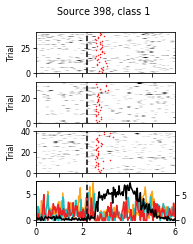

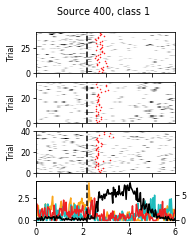

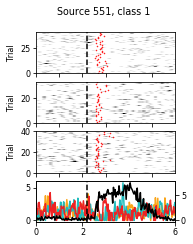

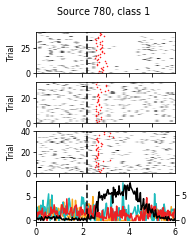

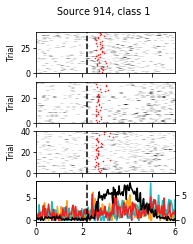

...

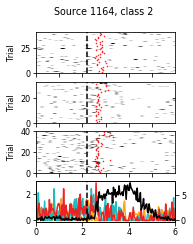

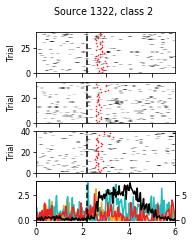

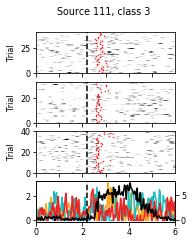

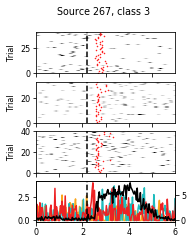

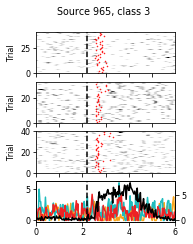

In [16]:
### Plot sources that are selective between odor onset and lick onset
do_plot_pre_lick_cells = False

if do_plot_pre_lick_cells:
    task_classes = all_nmf['mr2']['ordered_super_clustering']
    trial_sets = all_nmf['mr2']['trial_sets']


    pre_lick_dir = os.path.join(cluster_figs_dir, 'avg_plots_{}'.format(n_components), 
                                 'pre_lick_sources', str(dataset_id))
    os.makedirs(pre_lick_dir, exist_ok=True)

    odor_onset = 65

    earliest_frame = odor_onset
    latest_frame = 74
    which_classes = [1, 2, 3]
    which_sets = [0, 1, 2]
    lick_rates = allCT[CT_ind].bd.spout_lick_rates
    spike_rates = allCT[CT_ind].St
    cu.plot_pre_lick_sources(lick_rates, spike_rates,
                          task_classes, trial_sets, 
                          which_classes, which_sets,
                          earliest_frame, latest_frame,
                          fps, save_dir=pre_lick_dir)



0
795
/home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/19


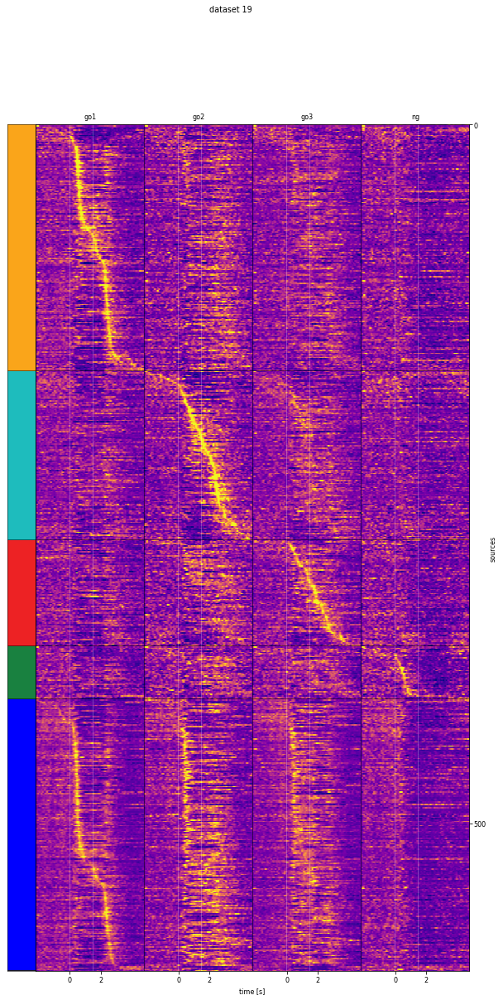

In [18]:
### Generate the super-clustering ordered average trace figure.
if 'mr2' in all_nmf.keys():
    source_coloring = cu.assign_colors_to_sources(all_nmf['mr2']['ordered_clustering'], 
                                                  all_nmf['mr2']['ordered_super_clustering'],
                                                  cmap='jet',
                                                  same_within_super_cluster=True,
                                                  specify_discrete_colors=True)

    trial_set_inds = all_nmf['mr2']['trial_set_inds']
    trial_names = all_nmf['mr2']['trial_names']
    label_positions = trial_set_inds + np.diff(trial_set_inds)[0]/2 ## To label each trial type.
    cm = 'plasma'
    cu.plot_clustered_sources(all_nmf['mr2']['ordered_clustering'], 
                              all_nmf['mr2']['ordered_super_clustering'], 
                              source_means=data, 
                              source_coloring=source_coloring,
                              cmap=cm, 
                              clim=[-2, 4],
                              vertical_lines={'k':trial_set_inds, 
                                              'w': np.hstack((trial_set_inds+64, 
                                                              trial_set_inds+108))
                                             }, 
                              title_str='dataset {}'.format(dataset_id),
                              labels={'labels':trial_names, 
                                      'positions':label_positions},
                              time_labels={'labels':['0']*len(trial_names) + 
                                                    ['2']*len(trial_names),
                                           'positions': np.hstack(
                                               (trial_set_inds+event_frames[1],
                                                trial_set_inds+event_frames[1]+2*fps))},
                              exclude_super_clusters=[0],
                             )

    savename = 'id'+str(dataset_id)+'_'+protocol+'_traces_'+cm+'.pdf'
    if not os.path.isdir(clust_fig_dir):
        os.makedirs(clust_fig_dir)
    print(clust_fig_dir)
#     plt.gcf().set_size_inches(w=2.5, h=4) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 
else:
    print('Not plotting super-clusters.')

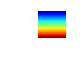

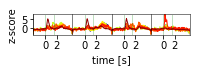

In [14]:
### Now plot the average traces of each super cluster.
if 'mr2' in all_nmf.keys():
    cu.plot_cluster_averages(data, 
                             all_nmf['mr2']['ordered_clustering'], 
                             all_nmf['mr2']['ordered_super_clustering'], 
                             trial_set_inds, by_trial_type=True,
                             event_frames=[event_frames[1],
                                           event_frames[1]+2*fps],
                             event_labels=[0, 2],
                             time_labels={'labels':['0']*len(trial_names) + ['2']*len(trial_names),
                                           'positions': np.hstack((trial_set_inds+event_frames[1],
                                                                  trial_set_inds+event_frames[1]+2*fps))},
                             vertical_lines={'k':trial_set_inds, 
                                             'g': np.hstack((trial_set_inds+64, 
                                                              trial_set_inds+108))
                                             },
                            )
    
    savename = 'id'+str(dataset_id)+'_'+protocol+'_cluster_averages.pdf'
    plt.gcf().set_size_inches(w=2.819, h=0.4) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 

In [295]:
### You can try only include the trial-modulated sources. 
do_include_only_task_modulated = False
if do_include_only_task_modulated:
    source_coloring[~tm, :] = np.array([0.8, 0.8, 0.8, 0.8])

In [296]:
clust_fig_dir

'/home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/7'

[0 1 2 3 4 5]


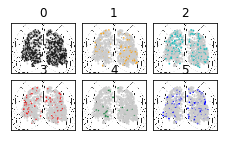

In [297]:
### For each super cluster, plot the location of the included cells, over grey background dots,
### with the corresponding color from the above plot. 
if 'mr2' in all_nmf.keys():
    subplot_titles = None
#     subplot_titles= all_nmf['4way']['super_clust_info']['titles']
    cu.plot_cluster_spatial_maps(source_coloring,
                                 all_nmf['mr2']['ordered_super_clustering'],
                                 all_nmf['mr2']['centroid_atlas_coords'],
                                 radius=3, #0.5, 
                                 do_overlay=False,
                                 background_color=np.array([0.8, 0.8, 0.8, 0.8]),
                                 subplot_titles= subplot_titles,
                                 specific_clusters=None)

    savename = 'id'+str(dataset_id)+'_'+protocol+'_spatial_maps.pdf'
    if subplot_titles is None:
        plt.gcf().set_size_inches(w=3.7, h=2) # Control size of figure in inches
    else:
        plt.gcf().set_size_inches(w=2.5, h=2) # Control size of figure in inches

    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 
    
### TODO: write a test or something that double checks this function. Do a spot check that looks at one
### cell: Use the original function to look at individual cells, look at its position, look at which cluster
### it is in, which super cluster it is in, and does it align with the spatial maps?

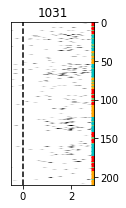

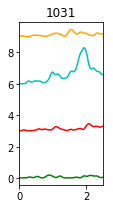

In [302]:
### Plot single trials for the schematic, with the trial type on the right side, and also the mean traces
# plt.figure(figsize=(15, 15))
if dataset_id == 7:
    source_id = 1031
#     source_id = 5
else: 
    source_id = 0 # until further notice...
    
trial_types = np.copy(allCT[CT_ind].bd.spout_positions)
trial_types[np.where(allCT[CT_ind].bd.trial_types==4)[0]] = 0

event_frame = allCT[CT_ind].event_frames[1]
cu.plot_single_trials_with_trial_type(source_id, rates, trial_types,
                                     start_f=50, end_f=150, 
                                      event_frame=event_frame, fps=CT.fps,
                                     cmap='gray_r')

plt.gcf().set_size_inches(w=1.5, h=3) # Control size of figure in inches
savename = 'id'+str(dataset_id)+'_'+protocol+'_single_trial_'+str(source_id)+'.pdf'
plt.savefig(os.path.join(clust_fig_dir, savename), 
            transparent=True, rasterized=True, dpi=600) 

### Now plot mean traces
plt.figure()
cu.plot_trial_type_mean_traces(source_id, rates, trial_types, event_frame, CT.fps)

plt.gcf().set_size_inches(w=1.5, h=3) # Control size of figure in inches
savename = 'id'+str(dataset_id)+'_'+protocol+'_single_trial_means_'+str(source_id)+'.pdf'
plt.savefig(os.path.join(clust_fig_dir, savename), 
            transparent=True, rasterized=True, dpi=600) 


In [240]:
# If you want to explore which sources would be good, can plot with this
do_explore_single_sources = False
if do_explore_single_sources:
    for i in np.where(all_nmf['mr2']['ordered_super_clustering'] == 1)[0]:
        plt.figure()
        plt.imshow(rates[i, :, :].T)
        plt.title(i)

Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt7_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt11_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt18_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt19_r_n_l.pkl
[-0.375  0.625  1.625  2.625  3.625]
[0.9803921568627451, 0.6470588235294118, 0.10196078431372549, 1.0]
[0.10800432 0.10253456 0.09089526 0.11336383 0.1222982 ]
[0.01926525 0.03066051 0.02657722 0.01434062 0.01720318]
[-0.225, 0.775, 1.775, 2.775, 3.775]
[0.11764705882352941, 0.7372549019607844, 0.7411764705882353, 1.0]
[0.14197198 0.12189991 0.12444793 0.11447678 0.06447107]
[0.0343446  0.01359703 0.01877215 0.02260207 0.01835739]
[-0.07500000000000001, 0.925, 1.9249999999999998, 2.925, 3.925]
[0.9294117647058824, 0.13333333333333333, 0.1411764705882353, 1.0]
[0.06955764 0.06515329 0.0601077  0.0928081  0.08961819]
[0.00

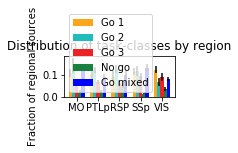

In [242]:
### Plot spatial distribution by region

dsets_spatial = [7, 11, 18, 19]

spatial_sets = [{'method':'classify', 'protocol':'mr2', 'randseed':'', 'n_components':'', 'l1':''}]

(all_clusters_region_dist, 
 all_total_cells_per_region) = cu.get_task_clusters_per_region(datasets,
                                                            allCT,
                                                            spatial_sets, 
                                                            dsets_spatial,
                                                            clustering_dir
                                                           )

region_ordering = ['MO', 'PTLp', 'RSP', 'SSp', 'VIS']
(all_spatial_dist, 
 all_total_cells) = cu.organize_clusters_per_region(dsets_spatial,
                                                    all_clusters_region_dist,
                                                    all_total_cells_per_region,
                                                     regions=region_ordering)

do_group_by_region = True

if do_group_by_region:
#     region_colors = [[0, 0, 0, 1.0]] + cu.get_color_template()
    region_colors = cu.get_color_template()

    task_class_names = ['Unassigned', 'Go 1', 'Go 2', 'Go 3', 'No go', 'Go mixed']
    cu.plot_clusters_per_region(all_spatial_dist, all_total_cells, 
                                regions=region_ordering,
                                task_class_names=task_class_names,
                                do_normalize=True, bar_width=0.15, 
                                start_cluster=1, group_colors=region_colors,
                               group_by_region=True)
    
else:
    region_colors = [[.1,.1,.1], [.3,.3,.3], [.5,.5,.5], [.7,.7,.7], [.9,.9,.9]]
    task_class_names = ['Go 1', 'Go 2', 'Go 3', 'No go', 'Go mixed']
    cu.plot_clusters_per_region(all_spatial_dist, all_total_cells, 
                                regions=region_ordering,
                                task_class_names=task_class_names,
                                do_normalize=True, bar_width=0.15, 
                                start_cluster=1, group_colors=region_colors,
                               group_by_region=False)

### Do stats...
plt.gcf().set_size_inches(w=2, h=0.75) # Control size of figure in inches
savename = 'sources_in_region_by_cluster'+'_'+protocol+'_{}'.format(do_group_by_region)+'.pdf'
plt.savefig(os.path.join(cluster_figs_dir, savename), 
            transparent=True, rasterized=True, dpi=600) 

In [243]:
cluster_figs_dir

'/home/izkula/Dropbox//cosmos/fig_plots/fig7/'

### Plot spatial statistics

In [345]:
### Plot spatial statistics
### Load the data

dsets_spatial = [7, 11, 18, 19, 35]

spatial_sets = [{'method':'classify', 'protocol':'mr2', 'randseed':'', 'n_components':'', 'l1':''}]

use_transformed_centroids=True
centroid_scale_factor = 9 # In mm
(centroids, labels) = cu.load_centroids_and_task_labels(datasets, 
                                                        allCT,
                                                        spatial_sets,
                                                        dsets_spatial,
                                                        clustering_dir,
                                                        use_transformed_centroids,
                                                        centroid_scale_factor
                                                       )

Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt7_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt11_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt18_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt19_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt35_r_n_l.pkl


In [347]:
### Make dir for saveout
spatial_stat_dir = os.path.join(clustering_dir, 
                                'spatial_stat_transformed{}'.format(int(use_transformed_centroids)))
os.makedirs(spatial_stat_dir, exist_ok=True)

In [348]:
spatial_stat_dir

'/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1'

In [349]:
### Compute pairwise distance histogram for each class

### 10k shuffles: two-sided ---> 5000, 10-way hist bonferonni ---> 500, 
### 5-way task class bonferonni ---> 100 --> p<0.01

do_compute_pairwise_dists = True

if do_compute_pairwise_dists:
    clusts = np.arange(1, 6)
    nshuff=10001
    (all_shuffle_dists,
     all_dists) = cu.generate_all_pairwise_dists(labels, centroids, dsets_spatial, 
                                              clusts, spatial_stat_dir, nshuff=nshuff)

dset: 7, clust: 1, shuff: 0
dset: 7, clust: 1, shuff: 500
dset: 7, clust: 1, shuff: 1000
dset: 7, clust: 1, shuff: 1500
dset: 7, clust: 1, shuff: 2000
dset: 7, clust: 1, shuff: 2500
dset: 7, clust: 1, shuff: 3000
dset: 7, clust: 1, shuff: 3500
dset: 7, clust: 1, shuff: 4000
dset: 7, clust: 1, shuff: 4500
dset: 7, clust: 1, shuff: 5000
dset: 7, clust: 1, shuff: 5500
dset: 7, clust: 1, shuff: 6000
dset: 7, clust: 1, shuff: 6500
dset: 7, clust: 1, shuff: 7000
dset: 7, clust: 1, shuff: 7500
dset: 7, clust: 1, shuff: 8000
dset: 7, clust: 1, shuff: 8500
dset: 7, clust: 1, shuff: 9000
dset: 7, clust: 1, shuff: 9500
dset: 7, clust: 1, shuff: 10000
1.5342445373535156
2.711621046066284
dset: 7, clust: 2, shuff: 0
dset: 7, clust: 2, shuff: 500
dset: 7, clust: 2, shuff: 1000
dset: 7, clust: 2, shuff: 1500
dset: 7, clust: 2, shuff: 2000
dset: 7, clust: 2, shuff: 2500
dset: 7, clust: 2, shuff: 3000
dset: 7, clust: 2, shuff: 3500
dset: 7, clust: 2, shuff: 4000
dset: 7, clust: 2, shuff: 4500
dset: 7, 

dset: 18, clust: 2, shuff: 9000
dset: 18, clust: 2, shuff: 9500
dset: 18, clust: 2, shuff: 10000
1.5587646961212158
3.4046616554260254
dset: 18, clust: 3, shuff: 0
dset: 18, clust: 3, shuff: 500
dset: 18, clust: 3, shuff: 1000
dset: 18, clust: 3, shuff: 1500
dset: 18, clust: 3, shuff: 2000
dset: 18, clust: 3, shuff: 2500
dset: 18, clust: 3, shuff: 3000
dset: 18, clust: 3, shuff: 3500
dset: 18, clust: 3, shuff: 4000
dset: 18, clust: 3, shuff: 4500
dset: 18, clust: 3, shuff: 5000
dset: 18, clust: 3, shuff: 5500
dset: 18, clust: 3, shuff: 6000
dset: 18, clust: 3, shuff: 6500
dset: 18, clust: 3, shuff: 7000
dset: 18, clust: 3, shuff: 7500
dset: 18, clust: 3, shuff: 8000
dset: 18, clust: 3, shuff: 8500
dset: 18, clust: 3, shuff: 9000
dset: 18, clust: 3, shuff: 9500
dset: 18, clust: 3, shuff: 10000
1.7416725158691406
4.22406268119812
dset: 18, clust: 4, shuff: 0
dset: 18, clust: 4, shuff: 500
dset: 18, clust: 4, shuff: 1000
dset: 18, clust: 4, shuff: 1500
dset: 18, clust: 4, shuff: 2000
dset

dset: 35, clust: 4, shuff: 6000
dset: 35, clust: 4, shuff: 6500
dset: 35, clust: 4, shuff: 7000
dset: 35, clust: 4, shuff: 7500
dset: 35, clust: 4, shuff: 8000
dset: 35, clust: 4, shuff: 8500
dset: 35, clust: 4, shuff: 9000
dset: 35, clust: 4, shuff: 9500
dset: 35, clust: 4, shuff: 10000
1.2457964420318604
1.4076557159423828
dset: 35, clust: 5, shuff: 0
dset: 35, clust: 5, shuff: 500
dset: 35, clust: 5, shuff: 1000
dset: 35, clust: 5, shuff: 1500
dset: 35, clust: 5, shuff: 2000
dset: 35, clust: 5, shuff: 2500
dset: 35, clust: 5, shuff: 3000
dset: 35, clust: 5, shuff: 3500
dset: 35, clust: 5, shuff: 4000
dset: 35, clust: 5, shuff: 4500
dset: 35, clust: 5, shuff: 5000
dset: 35, clust: 5, shuff: 5500
dset: 35, clust: 5, shuff: 6000
dset: 35, clust: 5, shuff: 6500
dset: 35, clust: 5, shuff: 7000
dset: 35, clust: 5, shuff: 7500
dset: 35, clust: 5, shuff: 8000
dset: 35, clust: 5, shuff: 8500
dset: 35, clust: 5, shuff: 9000
dset: 35, clust: 5, shuff: 9500
dset: 35, clust: 5, shuff: 10000
4.01

In [351]:
fname

'/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1/35_clust_5_pairwise_dists_nshuff_10001.npz'

In [352]:
do_load_spatial_dists = True

if do_load_spatial_dists:
    nshuff = 10001
    clusts = np.arange(1, 6)
    all_shuffle_dists = dict()
    all_dists = dict()
    for dd in dsets_spatial:
        all_shuffle_dists[dd] = dict()
        all_dists[dd] = dict()
        for clust in clusts:
            fname = os.path.join(spatial_stat_dir, '{}_clust_{}_pairwise_dists_nshuff_{}.npz'.format(dd, clust, nshuff))
            print(fname)
            with open(fname, 'rb') as ff:
                out = np.load(ff)
                all_shuffle_dists[dd][clust] = out['shuffle_dists']
                all_dists[dd][clust] = out['dists']

/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1/7_clust_1_pairwise_dists_nshuff_10001.npz
/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1/7_clust_2_pairwise_dists_nshuff_10001.npz
/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1/7_clust_3_pairwise_dists_nshuff_10001.npz
/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1/7_clust_4_pairwise_dists_nshuff_10001.npz
/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1/7_clust_5_pairwise_dists_nshuff_10001.npz
/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1/11_clust_1_pairwise_dists_nshuff_10001.npz
/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1/11_clust_2_pairwise_dists_nshuff_10001.npz
/home/izkula/Dropbox//cosmos_data/clustering_results/spatial_stat_transformed1/11_clust_3_pairwise_dists_nshuff_10001.npz
/home/izkula/Dropbox//cosmos_

In [365]:
### Generate histograms
if use_transformed_centroids:
    bins = np.arange(10)
else:
    bins = np.arange(0, 501, 50)
which_dsets = [7, 11, 18, 19, 35]
(all_shuffle_hist,
 all_hist) = cu.generate_hists_from_dists(all_shuffle_dists, all_dists, which_dsets, bins)

27.919584274291992
22.185468196868896
21.554968118667603
32.91509938240051
30.560566425323486


In [366]:
all_dists

{7: {1: array([1.89007706, 4.79621967, 2.03055291, ..., 7.7176998 , 8.09914096,
         0.4890438 ]),
  2: array([4.87032171, 4.54105817, 2.59003933, ..., 1.85411371, 7.16854263,
         7.16716762]),
  3: array([2.28045848, 2.88861752, 1.72413172, ..., 7.80268831, 1.00350826,
         7.65304585]),
  4: array([2.53921356, 2.36871282, 1.12876509, 4.42114406, 2.4065931 ,
         2.53067936, 2.81413093, 4.56737286, 2.86556885, 2.95257517,
         2.46512769, 2.88854535, 0.83471714, 4.43671542, 4.16885161,
         2.61745823, 1.30239594, 2.80769408, 2.68074055, 3.3743744 ,
         2.77403092, 1.57846536, 3.10358527, 2.56302144, 4.8217879 ,
         3.28754822, 3.91101739, 3.13191631, 2.45402143, 4.28420541,
         4.16423375, 4.55622949, 4.54614399, 3.60353318, 4.12271661,
         0.58004197, 0.07027607, 0.37559843, 4.12047242, 0.33634311,
         1.02425636, 0.09386141, 2.97136988, 3.19931633, 5.07008443,
         3.90066958, 0.39764873, 3.71327952, 0.93046673, 0.29132292,
    

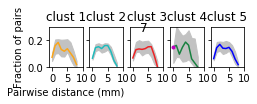

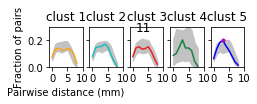

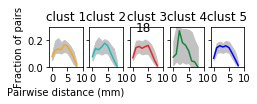

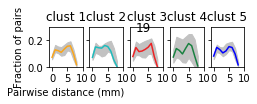

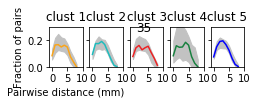

In [368]:
### Generate significance thresholds
coloring = cu.get_color_template()
coloring = coloring[1:]

(all_hist_signif,
 all_hist_insignif) = cu.overlay_spatial_on_null_dist(all_shuffle_hist, all_hist,
                                                      bins, which_dsets, np.arange(1, 6),
#                                                       savepath=None)
                                                     savepath=cluster_figs_dir,
                                                     colors=coloring,
                                                     use_transformed_centroids=use_transformed_centroids)


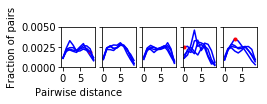

In [139]:
### Now plot the significant points
plt.figure(figsize=(15, 3))
for i, clust in enumerate(clusts):
    plt.subplot(1, len(clusts), i+1)
    for dset in dsets:
#         plt.plot(all_hist_insignif[dset][clust], color=[0, 0, 1, 0.2], marker='o')
        plt.plot(all_hist[dset][clust], color=[0, 0, 1, 1])
        plt.plot(all_hist_signif[dset][clust], 'r.')

    plt.ylim([0, 0.005])
    if i > 0:
        plt.gca().axes.yaxis.set_ticklabels([])
    if i == 0:
        plt.ylabel('Fraction of pairs')
        plt.xlabel('Pairwise distance')
        
plt.gcf().set_size_inches(w=3.5,h=0.75)  # Control size of figure in inches
plt.savefig(os.path.join(cluster_figs_dir, 'signif_pairwise_spatial_dist_hist.pdf'))
        
    

### Now simulate some data to see what sort of sensitivity you should have...

In [222]:
fake_dataset_id = 7 #16 #11

n_components = 40
sets = [{'method':'classify', 'protocol':'mr2', 'randseed':'', 'n_components':'', 'l1':''}]
fake_cluster_info = cu.load_clustering_results(fake_dataset_id, sets, clustering_dir, protocol_as_key=True)

Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt7_r_n_l.pkl


dset: 129, clust: 1, shuff: 0
dset: 129, clust: 1, shuff: 500
dset: 129, clust: 1, shuff: 1000
dset: 129, clust: 1, shuff: 1500
dset: 129, clust: 1, shuff: 2000
dset: 129, clust: 1, shuff: 2500
dset: 129, clust: 1, shuff: 3000
dset: 129, clust: 1, shuff: 3500
dset: 129, clust: 1, shuff: 4000
dset: 129, clust: 1, shuff: 4500
dset: 129, clust: 1, shuff: 5000
dset: 129, clust: 1, shuff: 5500
dset: 129, clust: 1, shuff: 6000
dset: 129, clust: 1, shuff: 6500
dset: 129, clust: 1, shuff: 7000
dset: 129, clust: 1, shuff: 7500
dset: 129, clust: 1, shuff: 8000
dset: 129, clust: 1, shuff: 8500
dset: 129, clust: 1, shuff: 9000
dset: 129, clust: 1, shuff: 9500
dset: 129, clust: 1, shuff: 10000
1.4546012878417969
2.27239727973938
dset: 129, clust: 2, shuff: 0
dset: 129, clust: 2, shuff: 500
dset: 129, clust: 2, shuff: 1000
dset: 129, clust: 2, shuff: 1500
dset: 129, clust: 2, shuff: 2000
dset: 129, clust: 2, shuff: 2500
dset: 129, clust: 2, shuff: 3000
dset: 129, clust: 2, shuff: 3500
dset: 129, clu

/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/lib/function_base.py:838: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


5.575217008590698


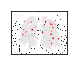

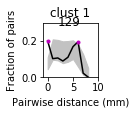

In [425]:
### Make an example actually clustered dataset (make a figure scaling this...)


all_fake_labels = dict()
all_fake_centroids = dict()

for fake_dset in range(129, 130):
# for fake_dset in range(100, 108):

    (fake_labels, fake_centroids) = cu.get_fake_labels_and_centroids(labels[7], centroids[7], 
                                                                     fake_dset)
        
    if fake_labels is not None:
        all_fake_labels[fake_dset] = fake_labels
        all_fake_centroids[fake_dset] = fake_centroids

        which_sources = fake_labels.astype('bool')
        source_coloring = np.ones((len(fake_labels), 4))
        source_coloring[which_sources, :] = np.array([1, 0, 0, 1])
        RGBA = np.copy(np.squeeze(source_coloring))
        RGBA[~which_sources, :] = np.array([0.9, 0.9, 0.9, 0.9])

        plt.figure()
        utils.centroids_on_atlas(RGBA, np.arange(len(which_sources)), 
                                 fake_cluster_info['mr2']['centroid_atlas_coords'],
                                 None,
                                 max_radius=3,
                                 rotate90=True)    


        plt.gcf().set_size_inches(w=1, h=1) # Control size of figure in inches
        savedir = os.path.join(cluster_figs_dir, 'simulated')
        os.makedirs(savedir, exist_ok=True)
        savename = '{}_simulated_cluster_map.pdf'.format(fake_dset)
        plt.savefig(os.path.join(savedir, savename), 
                    transparent=True, rasterized=True, dpi=600) 

        do_compute_pairwise_dists = True

        if do_compute_pairwise_dists:
            clusts = np.arange(1, 6)
            nshuff=10001
            which_fake_dsets = [fake_dset] #np.arange(100, 107)
            (all_shuffle_dists,
             all_dists) = cu.generate_all_pairwise_dists(all_fake_labels, all_fake_centroids, which_fake_dsets, 
                                                         clusts, spatial_stat_dir, nshuff=nshuff)

            ### Generate histograms
            if use_transformed_centroids:
                bins = np.arange(10)
            else:
                bins = np.arange(0, 501, 50)  
            (all_shuffle_hist,
             all_hist) = cu.generate_hists_from_dists(all_shuffle_dists, all_dists, which_fake_dsets, bins)

            ### Generate significance thresholds
            (all_hist_signif,
             all_hist_insignif) = cu.overlay_spatial_on_null_dist(all_shuffle_hist, all_hist,
                                                                  bins, which_fake_dsets, [1],
                                                                  savepath=None, 
                                                                  use_transformed_centroids=use_transformed_centroids)
            #                                                      savepath=cluster_figs_dir)
            plt.gcf().set_size_inches(w=1, h=1) # Control size of figure in inches
            savename = '{}_pairwise_hist.pdf'.format(fake_dset)
            plt.savefig(os.path.join(savedir, savename), 
                        transparent=True, rasterized=True, dpi=600) 

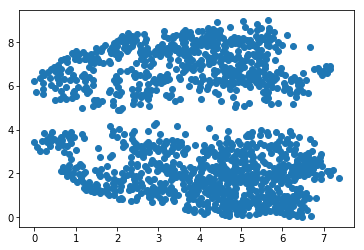

In [416]:
plt.plot(fake_centroids[:, 0], fake_centroids[:, 1], 'o')

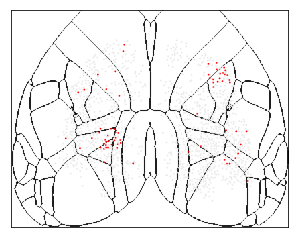

In [423]:
        plt.figure()
        utils.centroids_on_atlas(RGBA, np.arange(len(which_sources)), 
                                 fake_cluster_info['mr2']['centroid_atlas_coords'],
                                 None,
                                 max_radius=3,
                                 rotate90=True)    

# See fig_cluster_summary_SINGLE_TRIAL for clustering stuff. 

# Now plot local cluster stuff.

/home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/19


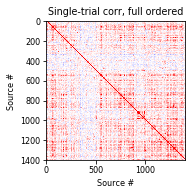

In [19]:
# 0.5a) Plot clustered single-trial trace correlation matrix

CT_ind = np.where(np.array(datasets) == dataset_id)[0][0]
rates = gaussian_filter1d(allCT[CT_ind].St, 1.5, axis=1, mode='constant')
rates_flat = np.reshape(rates, (rates.shape[0], rates.shape[1]*rates.shape[2]), order='F')
z_rates_flat = zscore(rates_flat, axis=1)
C = np.corrcoef(z_rates_flat)
for protocol in ['full']: ## ['full', '4way']
    oc = all_nmf[protocol]['ordered_clustering']
    plt.figure()
    plt.imshow(C[:, np.argsort(oc)][np.argsort(oc),:], clim=[-0.2, 0.2], cmap=plt.cm.bwr)
    plt.title('Single-trial corr, {} ordered'.format(protocol))
    plt.ylabel('Source #')
    plt.xlabel('Source #')
    
    savename = 'id'+str(dataset_id)+'_'+protocol+'_singletrialcorr.pdf'
    print(clust_fig_dir)
    plt.gcf().set_size_inches(w=2.5, h=4) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 

[0]
[1]
[2]


/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[3]
[4]


/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


[5]
[6]
[7]
[8]
[9]
[10]
[11]
[12]
[13]
[14]
[15]
[16]
[17]
[18]
[19]
[20]
[21]
[22]
[23]
[24]
[25]
[26]
[27]
[28]
[29]
[30]
[31]
[32]
[33]
[34]
[35]
[36]
[37]
[38]
[39]


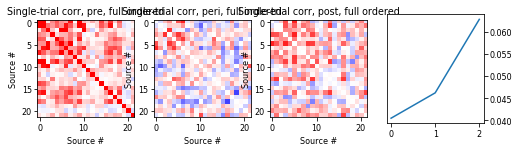

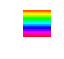

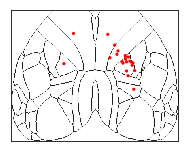

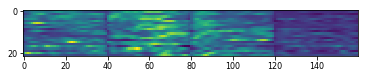

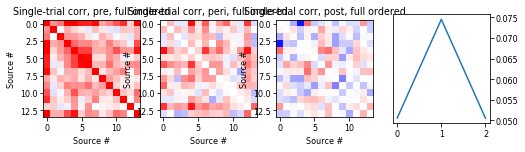

...

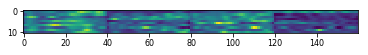

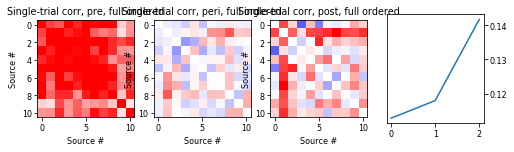

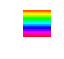

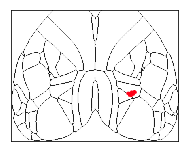

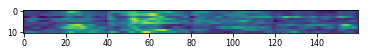

In [51]:
# 0.5a) Plot correlation matrix during different parts of trial

data = cu.concatenate_trial_type_avgs(all_nmf['mr2']['trial_sets'], rates, 
                                  do_plot=False)

which_trials = np.arange(allCT[CT_ind].St.shape[2])
which_cells = np.arange(allCT[CT_ind].ncells)
which_times = {'pre': np.arange(22,62), 'peri': np.arange(65,105), 'post': np.arange(110, 150)}

all_C = dict()
for name in ['pre', 'peri', 'post']:
    which_time = which_times[name]
    CT_ind = np.where(np.array(datasets) == dataset_id)[0][0]
    St = allCT[CT_ind].St[which_cells, :, :][:, which_time, :][:, :, which_trials]
    rates = gaussian_filter1d(St, 1.5, axis=1, mode='constant')
    rates_flat = np.reshape(rates, (rates.shape[0], rates.shape[1]*rates.shape[2]), order='F')
    z_rates_flat = zscore(rates_flat, axis=1)
    C = np.corrcoef(z_rates_flat)
    all_C[name] = C
    
for which_clust in np.sort(np.unique(all_nmf[protocol]['ordered_clustering'])):
# for which_clust in[1, 2]:    
    plt.figure(figsize=(8, 2))
    mean_c = []
    for i, name in enumerate(['pre', 'peri', 'post']):
        plt.subplot(1, 4, i+1)
        for protocol in ['full']: ## ['full', '4way']
            oc = all_nmf[protocol]['ordered_clustering']
            if name == 'pre':
                C = all_C[name]
            else:
                C = all_C[name] - all_C['pre']
#             C_to_plot = C[:, np.argsort(oc)][np.argsort(oc),:]
            C_to_plot = C[:, oc == which_clust][oc == which_clust,:]
            
            corrvals = np.triu(all_C[name][:, oc == which_clust][oc == which_clust,:], 1)
            corrvals = corrvals[np.where(corrvals > 0)[0]]
            mean_c.append(np.mean(corrvals))
            plt.imshow(C_to_plot, clim=[-0.2, 0.2], cmap=plt.cm.bwr)
            plt.title('Single-trial corr, {}, {} ordered'.format(name, protocol))
            plt.ylabel('Source #')
            plt.xlabel('Source #')

    #         savename = 'id'+str(dataset_id)+'_'+protocol+'_singletrialcorr_{}.pdf'.format(name)
    #         print(clust_fig_dir)
    #         plt.gcf().set_size_inches(w=2.5, h=4) # Control size of figure in inches
    #         plt.savefig(os.path.join(clust_fig_dir, savename), 
    #                     transparent=True, rasterized=True, dpi=600) 
    
    # Plot the correlation across pre, peri, post
    plt.subplot(1, 4, 4)
    plt.plot(np.array(mean_c))
    plt.gca().yaxis.tick_right()

    
    ### BEGIN: TO FACTOR: PLOT A SPECIFIC CLUSTER
    clust1 = 'full'
    nmf_color = all_nmf[clust1]
    centroid_coloring = cu.assign_colors_to_sources(nmf_color['ordered_clustering'], 
                                                    nmf_color['ordered_super_clustering'],
                                                    cmap='hsv')

    nmf_centroid = all_nmf[clust1]
    centroids_to_plot = nmf_centroid['centroid_atlas_coords'][:, :]

    cu.plot_cluster_spatial_maps(centroid_coloring, 
                                 nmf_centroid['ordered_clustering'], 
                                 centroids_to_plot,
    #                              radius=2, 
                                 radius=10, #1.5, #1.5, #1.5, #1.5#10,
                                 background_color=np.array([0.9, 0.9, 0.9, 0.0]),
                                 do_overlay=True,
                                 specific_clusters = [which_clust],
                                 ncols=2) 
    plt.gcf().set_size_inches(w=3, h=3) # Control size of figure in inches
    ### END: TO FACTOR: PLOT A SPECIFIC CLUSTER
    
    ### Plot the mean trace for a cluster
    plt.figure()
    plt.imshow(scipy.stats.zscore(data[oc == which_clust, :], axis=1)) ## NEED TO DOUBLE CHECK THIS...
    
    
### Also to do: plot the correlation between cluster means...once you have those...

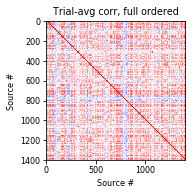

In [227]:
# 0.5b) Plot clustered trial-averaged trace correlation matrix (check that the protocol setting is correct...)

CT_ind = np.where(np.array(datasets) == dataset_id)[0][0]
rates = gaussian_filter1d(allCT[CT_ind].St, 1.5, axis=1, mode='constant')
trial_sets = all_nmf['full']['trial_sets']
avg_rates = cu.concatenate_trial_type_avgs(trial_sets, rates, 
                                      do_plot=False)
z_avg_rates = zscore(avg_rates, axis=1)
C = np.corrcoef(z_avg_rates)
for protocol in ['full']: #['full', '4way']
    oc = all_nmf[protocol]['ordered_clustering']
    plt.imshow(C[:, np.argsort(oc)][np.argsort(oc),:], clim=[-1, 1], cmap=plt.cm.bwr)
    plt.title('Trial-avg corr, {} ordered'.format(protocol))
    plt.ylabel('Source #')
    plt.xlabel('Source #')

    savename = 'id'+str(dataset_id)+'_'+protocol+'_trialavgcorr.pdf'
    plt.gcf().set_size_inches(w=2.5, h=4) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 

[1]


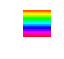

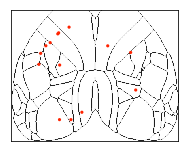

In [39]:
clust1 = 'full'
nmf_color = all_nmf[clust1]
centroid_coloring = cu.assign_colors_to_sources(nmf_color['ordered_clustering'], 
                                                nmf_color['ordered_super_clustering'],
                                                cmap='hsv')

nmf_centroid = all_nmf[clust1]
centroids_to_plot = nmf_centroid['centroid_atlas_coords'][:, :]

cu.plot_cluster_spatial_maps(centroid_coloring, 
                             nmf_centroid['ordered_clustering'], 
                             centroids_to_plot,
#                              radius=2, 
                             radius=10, #1.5, #1.5, #1.5, #1.5#10,
                             background_color=np.array([0.9, 0.9, 0.9, 0.0]),
                             do_overlay=True,
                             specific_clusters = [1],
                             ncols=2) 
plt.gcf().set_size_inches(w=3, h=3) # Control size of figure in inches


/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[30, 6, 10, 21, 39, 17, 3]


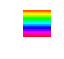

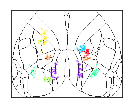

In [228]:
# 1) Plot overlaid local clusters
clust1 = 'full'
nmf_color = all_nmf[clust1]
centroid_coloring = cu.assign_colors_to_sources(nmf_color['ordered_clustering'], 
                                                nmf_color['ordered_super_clustering'],
                                                cmap='hsv')

nmf_centroid = all_nmf[clust1]
centroids_to_plot = nmf_centroid['centroid_atlas_coords'][:, :]

median_cluster_spread_full, _ = cu.compute_cluster_spread(all_nmf[clust1]['ordered_clustering'], 
                                                          all_nmf[clust1]['centroid_atlas_coords'])
# n_full = cu.compute_cluster_sizes(all_nmf[clust1]['ordered_clustering'])
# specific_clusters = np.where(np.logical_and(median_cluster_spread_full< 20, n_full>5))[0]
specific_clusters = None
if clust1 == 'full':
    if dataset_id == 11:
        if n_components == 40:
            specific_clusters = [5, 12, 28, 24, 21, 23, 32]
        elif n_components == 50:
            specific_clusters = [14, 34, 38, 8, 43, 5, 31] # Also potentially remove 31, add 30
    elif dataset_id == 7:
#         if n_components == 40:
#             specific_clusters = [0, 1, 17, 27, 8, ]
#         elif n_components == 50:
#             specific_clusters = None #[8, 24, 15, 32, 36, 0] # 25, 39? 0?
        if n_components == 40:
            specific_clusters = [0, 17, 27, 8, 21, 33, 7, 3]
        elif n_components == 50:
            specific_clusters = [23, 34, 36, 0, 39, 8, 7, 1] # None #[8, 24, 15, 32, 36, 0] # 25, 39? 0?
    elif dataset_id == 18:
        if n_components == 40:
            specific_clusters = [4, 6, 11, 24, 36]
        elif n_components == 50:
            specific_clusters = [11, 14, 18, 34,  10] #7? 16?
    elif dataset_id == 19:
        if n_components == 40:
            specific_clusters = [30, 6, 10, 21, 39, 17, 3]
        elif n_components == 50:
            specific_clusters = [8, 10, 24, 35, 48, 40, 19] #1? 18?, 16? 28?, 20? 33?
elif clust1 == 'baseline':
     if dataset_id == 11:
        specific_clusters = [7, 18, 27, 32, 42, 36, 0] # Also 0, 19, 23, 48? 24
        specific_clusters = [0, 7, 19, 32, 42, 36, 24] # Also 0, 19, 23, 48? 24
    

cu.plot_cluster_spatial_maps(centroid_coloring, 
                             nmf_centroid['ordered_clustering'], 
                             centroids_to_plot,
#                              radius=2, 
                             radius=1.5, #1.5, #1.5, #1.5, #1.5#10,
                             background_color=np.array([0.9, 0.9, 0.9, 0.0]),
                             do_overlay=True,
                             specific_clusters = specific_clusters,
                             ncols=2) 

savename = 'id'+str(dataset_id)+'_'+protocol+'_example_'+clust1+'_clusts.pdf'
plt.gcf().set_size_inches(w=2, h=2) # Control size of figure in inches
plt.savefig(os.path.join(clust_fig_dir, savename), 
            transparent=True, rasterized=True, dpi=600) 

/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[19, 13]


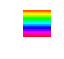

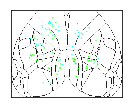

In [229]:
# 2) Plot overlaid GLOBAL clusters
clust1 = 'full'
nmf_color = all_nmf[clust1]
centroid_coloring = cu.assign_colors_to_sources(nmf_color['ordered_clustering'], 
                                                nmf_color['ordered_super_clustering'],
                                                cmap='hsv')

nmf_centroid = all_nmf[clust1]
centroids_to_plot = nmf_centroid['centroid_atlas_coords'][:, :]

median_cluster_spread_full, _ = cu.compute_cluster_spread(all_nmf[clust1]['ordered_clustering'], 
                                                          all_nmf[clust1]['centroid_atlas_coords'])
specific_clusters = None
if clust1 == 'full':
    if dataset_id == 11:
        if n_components == 40:
            specific_clusters = [18, 15]
        elif n_components == 50:
            specific_clusters = [] 
    elif dataset_id == 7:
        if n_components == 40:
            specific_clusters = [25, 12]
        elif n_components == 50:
            specific_clusters = []
    elif dataset_id == 18:
        if n_components == 40:
            specific_clusters = [15, 23]
        elif n_components == 50:
            specific_clusters = []
    elif dataset_id == 19:
        if n_components == 40:
            specific_clusters = [19, 13]
        elif n_components == 50:
            specific_clusters = [] 


cu.plot_cluster_spatial_maps(centroid_coloring, 
                             nmf_centroid['ordered_clustering'], 
                             centroids_to_plot,
#                              radius=2, 
                             radius=1.5, #1.5, #1.5, #1.5, #1.5#10,
                             background_color=np.array([0.9, 0.9, 0.9, 0.0]),
                             do_overlay=True,
                             specific_clusters = specific_clusters,
                             ncols=2) 

savename = 'id'+str(dataset_id)+'_'+protocol+'_example_'+clust1+'_global_clusts.pdf'
plt.gcf().set_size_inches(w=2, h=2) # Control size of figure in inches
plt.savefig(os.path.join(clust_fig_dir, savename), 
            transparent=True, rasterized=True, dpi=600) 

In [230]:
# 3) Quantify and compare locality of clusters.


do_plot_spatial_spread_vs_4way = False
if do_plot_spatial_spread_vs_4way:
    
    clust_spreads = cu.plot_cluster_spread_comparison(all_nmf, ['4way', 'full'],
                                                      min_clust_size=5)
    h, p = scipy.stats.kruskal(clust_spreads['4way'], clust_spreads['full'])
    plt.title('kruskal pvalue {:.2e}'.format(p))

    savename = 'id'+str(dataset_id)+'_'+protocol+clust1+'_clust_spread_comparison.pdf'
    plt.gcf().set_size_inches(w=1, h=1) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 

In [1]:
# 3) Quantify and compare locality of clusters vs. random!!!

do_plot_spatial_spread_vs_rand = True
if do_plot_spatial_spread_vs_rand:
    clust_spreads = cu.plot_cluster_spread_comparison(all_nmf, ['rand_full', 'full'], 
                                                      min_clust_size=5)
    h, p = scipy.stats.kruskal(clust_spreads['rand_full'], clust_spreads['full'])
    plt.title('kruskal pvalue {:.2e}'.format(p))

    savename = ('id'+str(dataset_id)+'_'+protocol+clust1+
                '_clust_spread_comparison_vs_random.pdf')
    plt.gcf().set_size_inches(w=1, h=1) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 

NameError: name 'cu' is not defined

In [232]:
### TODO: PLOT MEDIAN CLUSTER SPREAD ACROSS MICE. 

In [233]:
# 2) Plot histogram of in vs. out cluster correlation

/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


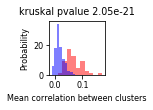

In [234]:
do_plot_corr_in_vs_out_full = True
if do_plot_corr_in_vs_out_full:
    clust1 = 'full'
    oc = all_nmf[clust1]['ordered_clustering']
    in_clust, out_clust = cu.compare_in_vs_out_of_cluster(oc, 
                                                          all_nmf[clust1]['corr_coef'], 
                                                          do_plot=False)
    plt.figure()
    cu.plot_in_vs_out_of_cluster_comparison(in_clust, out_clust)

    savename = 'id'+str(dataset_id)+'_'+clust1+'_in_vs_out_cluster.pdf'
    plt.gcf().set_size_inches(w=1, h=1) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 
    ## note: red is self-comparisons, blue is comparison to other clusters. 

In [235]:
do_plot_corr_in_vs_out_4way = False
if do_plot_corr_in_vs_out_4way:
    clust1 = '4way'
    oc = all_nmf[clust1]['ordered_clustering']
    in_clust, out_clust = cu.compare_in_vs_out_of_cluster(oc, 
                                                          all_nmf[clust1]['corr_coef'], 
                                                          do_plot=False)
    plt.figure()
    cu.plot_in_vs_out_of_cluster_comparison(in_clust, out_clust)

    savename = 'id'+str(dataset_id)+'_'+clust1+'_in_vs_out_task_cluster.pdf'
    plt.gcf().set_size_inches(w=1, h=1) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 

In [236]:
# 2.5) Plot in-cluster vs. next best cluster correlation, only including big events.

/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


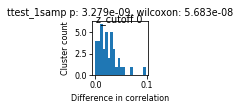

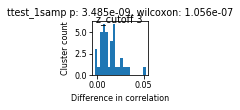

In [237]:
CT = allCT[np.where(np.array(datasets) == dataset_id)[0][0]]
smoothS = gaussian_filter1d(CT.S, 1.5, axis=1, mode='constant')
smoothZ = zscore(smoothS, axis=1)

for clust1 in ['full']: #['4way', 'full']
    if clust1 == 'full':
        oc = all_nmf[clust1]['ordered_clustering']
    elif clust1 == '4way':
         oc = all_nmf[clust1]['ordered_clustering']

    for z_cutoff in [0, 3]:
        traces = np.copy(smoothZ)
        traces[np.where(traces < z_cutoff)] = 0
        cc = np.corrcoef(traces)
        plt.figure()
        diffs = cu.compare_in_vs_next_best_cluster(oc, cc, do_plot=True, do_debug=False)
        plt.suptitle('z_cutoff {}'.format(z_cutoff))
        savename = 'id'+str(dataset_id)+'_'+clust1+'_in_vs_next_best_cluster_zcutoff='+str(z_cutoff)+'.pdf'
        plt.gcf().set_size_inches(w=1, h=1) # Control size of figure in inches
        plt.savefig(os.path.join(clust_fig_dir, savename), 
                    transparent=True, rasterized=True, dpi=600) 

In [238]:
# 3) Plot distribution of superclusters on local clusters

In [239]:
### TODO: ONLY INCLUDE CLUSTERS OF A CERTAIN SIZE?

/home/izkula/src/COSMOS/cosmos/traces/clustering_utils.py:1442: RuntimeWarning: invalid value encountered in true_divide
  


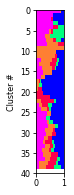

In [240]:
clust1 = 'full'
clust2 = 'mr2'
# nf = all_nmf['4way']
nf = all_nmf[clust2]

exclude_super_clusters = [0]

clust2_source_coloring = cu.assign_colors_to_sources(nf['ordered_clustering'], 
                                                     nf['ordered_super_clustering'],
                                                     cmap='jet',
                                                     same_within_super_cluster=True,
                                                     specify_discrete_colors=True)
clust2_colors = cu.get_super_clust_colors(nf['ordered_super_clustering'],
                                          clust2_source_coloring)
oc = all_nmf[clust1]['ordered_clustering']
normed_overlap, sorted_inds = cu.compare_cluster_memberships(oc, 
                                         nf['ordered_super_clustering'],
                                         do_sort=True,
                                         exclude_super_clusters=exclude_super_clusters)

### Was testing out various approaches for plotting. Can just revert to original with the bool flag.
use_orig = True
if not use_orig:
    min_clust_size = 3
    incl_clusts = np.squeeze(cu.compute_cluster_sizes(oc) >= min_clust_size)
    group_composition = normed_overlap[:, incl_clusts]
    use_hierarchical = False
    if use_hierarchical:
        from scipy.cluster.hierarchy import linkage, dendrogram
        Z = linkage(group_composition.T, 'ward')
        plt.figure()
        dn = dendrogram(Z)
        group_composition = group_composition[:, dn['leaves']]
    else:
        sort_normed_overlap, sorted_inds = cu.sort_rows_greedily(group_composition.T)
        group_composition = group_composition[:, sorted_inds]
else:
    group_composition = normed_overlap[:, sorted_inds]
    
plt.figure(figsize=(5, 5))
if exclude_super_clusters is not None:
    clust2_colors = np.delete(clust2_colors, exclude_super_clusters, axis=0)
cu.plot_stacked_group_composition(group_composition, clust2_colors)
plt.ylabel('Cluster #')

savename = 'id'+str(dataset_id)+'_'+clust1+'_'+clust2+'_cluster_membership_stacked_bar.pdf'
plt.gcf().set_size_inches(w=0.5, h=3) # Control size of figure in inches
plt.savefig(os.path.join(clust_fig_dir, savename), 
            transparent=True, rasterized=True, dpi=600) 

In [249]:
clust_fig_dir

'/home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/19'

In [241]:
## For testing:
## Check what the 8th row is in the above
## plot and then compare that with
## the spatial map plot below.
# sorted_inds[8]

In [242]:
# 4) Plot example local clusters (include sorted row number)

[30, 6, 10, 21, 39, 17, 3, 19, 13]
30 [38]
6 [16]
10 [34]
21 [27]
39 [14]
17 [22]
3 [23]
19 [9]
13 [24]


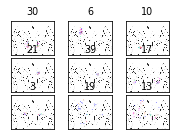

In [250]:
clust1 = 'full'
# nmf_color = all_nmf['4way']
nmf_color = all_nmf['mr2']
exclude_super_clusters = [0]


centroid_coloring = cu.assign_colors_to_sources(nmf_color['ordered_clustering'], 
                                                nmf_color['ordered_super_clustering'],
                                                cmap='jet',
                                                same_within_super_cluster=True,
                                                set_to_gray=exclude_super_clusters,
                                                specify_discrete_colors=True)

nmf_centroid = all_nmf[clust1]
centroids_to_plot = nmf_centroid['centroid_atlas_coords'][:, :]
if clust1 == 'full':
    if dataset_id == 11:
        if n_components == 40:
            specific_clusters = [5, 12, 28, 24, 21, 23, 32]
        elif n_components == 50:
            specific_clusters = [14, 34, 38, 8, 43, 5, 31] # Also potentially remove 31, add 30    elif dataset_id == 7:
#             specific_clusters = [8, 24, 15, 25, 32, 36] #39? 0?
    elif dataset_id == 18:
        if n_components == 40:
            specific_clusters = [4, 6, 11, 24, 36]
        elif n_components == 50:
            specific_clusters = [11, 14, 18, 34,  10, 16] #7? 16?
    elif dataset_id == 19:
        if n_components == 40:
            specific_clusters = [30, 6, 10, 21, 39, 17, 3, 19, 13]
        elif n_components == 50:
            specific_clusters = [8, 10, 24, 35, 48, 40, 19] #1? 18?, 16? 28?, 20? 33?
    elif dataset_id == 7:
        if n_components == 40:
            specific_clusters = [0, 17, 27, 8, 21, 33, 7, 3]
        elif n_components == 50:
            specific_clusters = [23, 34, 36, 0, 39, 8, 7, 1]
elif clust1 == 'baseline':
     if dataset_id == 11:
        specific_clusters = [24, 27, 32, 42, 36, 0] # Also 19
        specific_clusters = [0, 7, 19, 32, 42, 36, 24] # Also 0, 19, 23, 48? 24

    

cu.plot_cluster_spatial_maps(centroid_coloring, 
                             nmf_centroid['ordered_clustering'], 
                             centroids_to_plot,
                             radius=0.5, #0.5, 
                             background_color=np.array([0.9, 0.9, 0.9, 0.0]),
                             do_overlay=False,
                             specific_clusters = specific_clusters,
                             ncols=3)

savename = 'id'+str(dataset_id)+'_'+clust1+'_mr2_cluster_membership_spatial_map.pdf'
for ind in specific_clusters:
    print(ind, np.where(sorted_inds==ind)[0])
# print(sorted_inds[specific_clusters])
plt.gcf().set_size_inches(w=3, h=2) # Control size of figure in inches
plt.savefig(os.path.join(clust_fig_dir, savename), 
            transparent=True, rasterized=True, dpi=600) 

In [244]:
os.path.join(clust_fig_dir, savename)

'/home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/19/id19_full_mr2_cluster_membership_spatial_map.pdf'

Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt7_r1_n40_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt7_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt11_r1_n40_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt11_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt18_r1_n40_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt18_r_n_l.pkl
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt19_r1_n40_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/classify_mr2_expt19_r_n_l.pkl


/home/izkula/src/COSMOS/cosmos/traces/clustering_utils.py:1442: RuntimeWarning: invalid value encountered in true_divide
  


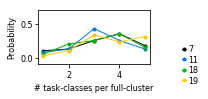

In [251]:
# 5) Quantify some statistic across mice for this cluster overlap effect. Compute some percentage of overlap.
### Should this only use the classified ones?
clust1 = 'full'
all_num_per_category = []
exclude_super_clusters = [0]
for d_id in [7, 11, 18, 19]:#[7, 11, 18, 19]:
    sets = [{'method':'nmf', 'protocol':'full', 'randseed':1, 'n_components':n_components, 'l1':0.0},
            {'method':'classify', 'protocol':'mr2', 'randseed':'', 'n_components':'', 'l1':''},
           ]
    a_nmf = cu.load_clustering_results(d_id, sets, clustering_dir, protocol_as_key=True)


    normed_overlap, sorted_inds = cu.compare_cluster_memberships(a_nmf[clust1]['ordered_clustering'], 
                                                         a_nmf['mr2']['ordered_super_clustering'],
                                                         do_sort=True,
                                                         exclude_super_clusters=exclude_super_clusters)
    dists = np.sum(normed_overlap > 0, axis = 0)
    num_per_category, labels = cu.total_num_per_category(dists)
    num_per_category /= (np.sum(num_per_category)+1e-5)
    all_num_per_category.append(num_per_category)
    plt.plot(labels, num_per_category, 'o-', label=d_id,
             linewidth=1, markersize=3,
             color=mouse_colors[np.where(np.array(datasets)==int(d_id))[0][0]])
    plt.ylabel('Probability')
    plt.xlabel('# task-classes per '+clust1+'-cluster')
    legend = plt.legend(frameon=False, 
                        bbox_to_anchor=(1.5, 0.5), handlelength=0.5, 
                        handletextpad=0.3, labelspacing=0.2)
    plt.ylim([-0.1, 0.7])
        
    savename = clust1+'cluster_overlap_distribution.pdf'
    plt.gcf().set_size_inches(w=2, h=1) # Control size of figure in inches
    plt.savefig(os.path.join(cluster_figs_dir, 'avg_plots_{}'.format(n_components), savename), 
                transparent=True, rasterized=True, dpi=600) 

In [252]:
np.vstack(all_num_per_category)

array([[0.09999998, 0.12499997, 0.24999994, 0.34999991, 0.17499996],
       [0.07499998, 0.12499997, 0.42499989, 0.24999994, 0.12499997],
       [0.04999999, 0.19999995, 0.24999994, 0.34999991, 0.14999996],
       [0.02564102, 0.10256408, 0.33333325, 0.23076917, 0.30769223]])

In [256]:
all_num_per_category = np.vstack(all_num_per_category)
scipy.stats.ttest_rel(all_num_per_category[:, 0], all_num_per_category[:, 3])

Ttest_relResult(statistic=-8.529835542293917, pvalue=0.0033850662317558024)

In [ ]:
### I need a name for these types of clusters:
### task-clusters
### intrinsic, local, single-trial, spontaneous, baseline (would need to recompute just using baseline), 
### noise (would need to recompute using noise correlation), specialized, 

### Comparison of explained variance with different clusterings (not using this now...)

In [239]:
### 6) Compare explained variance of different clusterings. NEEED TO REFACTOR THIS.
### TODO: DO THIS ON A TEST SET OF TRIALS??
all_evrs = {}
protocols = ['4way', 'full']
for ind, CT in enumerate(allCT):
    d_id = datasets[ind]
    all_nmf = {}
    for protocol in protocols:
        filename = os.path.join(clustering_dir, 'nmf_{}_expt{}.pkl'.format(protocol, d_id))
        with open(filename, 'rb') as f:
            nmf_results = pickle.load(f)
        all_nmf[protocol] = nmf_results
    print('Done loading: {}'.format(d_id))
    
    smooth_spikes = gaussian_filter1d(CT.St, 1.5, axis=1, mode='constant')
    rates = smooth_spikes
    which_traces = 'full'
    evrs = cu.get_cluster_explained_variances(rates, which_traces, 
                                              all_nmf, 
                                              all_nmf['4way']['trial_sets'])
    all_evrs[dataset_id] = evrs

Done loading: 7
full (1240, 50)
4way (1240, 50)
Done loading: 11
full (1084, 50)
4way (1084, 50)
Done loading: 18
full (1054, 50)
4way (1054, 50)
Done loading: 19
full (1401, 50)
4way (1401, 50)


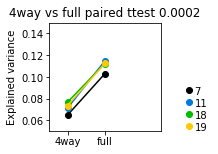

In [240]:
### 6b) Plot comparison of explained variance of different clusterings
# protocols = ['4way', 'baseline', 'full']
evr_sums = defaultdict(list)
for d_id in [7, 11, 18, 19]:
    evrs = all_evrs[d_id]
    [evr_sums[x].append(np.sum(evrs[x])) for x in evrs.keys()]
    plt.plot(np.arange(len(evrs.keys())), [np.sum(evrs[x]) for x in protocols], 
             'o-', label=d_id, 
             color=mouse_colors[np.where(np.array(datasets)==int(d_id))[0][0]])
    plt.xticks(np.arange(len(evrs.keys())), protocols)

# t, p1 = scipy.stats.ttest_rel(evr_sums['4way'], evr_sums['baseline'])
# t, p2 = scipy.stats.ttest_rel(evr_sums['full'], evr_sums['baseline'])
t, p3 = scipy.stats.ttest_rel(evr_sums['4way'], evr_sums['full'])

# plt.title('4way vs baseline paired ttest: {:.4f} '
#           '\n full vs baseline paired ttest: {:.4f}'
#           '\n 4way vs full paired ttest {:.4f}'.format(p1, p2, p3));
plt.title('4way vs full paired ttest {:.4f}'.format(p3));
plt.ylabel('Explained variance')
legend = plt.legend(frameon=False, 
                    bbox_to_anchor=(1.5, 0.5), handlelength=0.5, 
                    handletextpad=0.3, labelspacing=0.2)

plt.ylim([0.05, 0.15])
plt.xlim([-.5, 2.5])
savename = 'cluster_explained_variance_comparison_simple.pdf'
plt.gcf().set_size_inches(w=2, h=2) # Control size of figure in inches
plt.savefig(os.path.join(cluster_figs_dir, 'avg_plots_{}'.format(n_components), savename), 
            transparent=True, rasterized=True, dpi=600) 

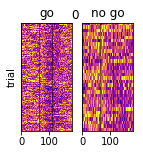

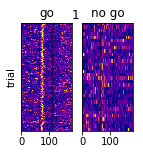

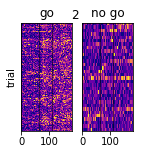

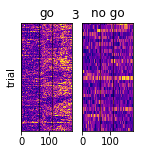

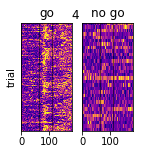

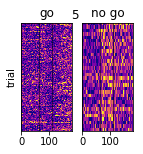

In [32]:
### 7) Plot individual trials of clusters
clust1 = '4way'

CT = allCT[np.where(np.array(datasets)==int(dataset_id))[0][0]]
clustering = all_nmf[clust1]['ordered_super_clustering']
for which_cluster in range(np.max(clustering)+1):
    trial_sets = all_nmf[clust1]['trial_sets']
    trial_sets = [np.logical_or.reduce((trial_sets[0], trial_sets[1], trial_sets[2])),
                  trial_sets[3]]    
#     trial_sets = np.logical_or.reduce((trial_sets[0], trial_sets[1], trial_sets[2]))

    cu.plot_cluster_means_across_trials(CT.St, 
                                        clustering, 
                                        which_cluster, 
                                        trial_sets, 
                                        trial_set_names=['go', 'no go'],
                                        event_frames=CT.event_frames, cmap='plasma')
    plt.suptitle(which_cluster)
    
    savedir = os.path.join(cluster_figs_dir, 'avg_plots', str(dataset_id), 'trials_'+clust1)
    if not os.path.isdir(savedir): os.makedirs(savedir)
    savename = 'cluster_mean_vs_trials_'+str(which_cluster)+'.pdf'
    plt.gcf().set_size_inches(w=2, h=2) # Control size of figure in inches
    plt.savefig(os.path.join(savedir, savename), 
                transparent=True, rasterized=True, dpi=600) 
    
    do_plot_centroids = False
    if do_plot_centroids:
        centroid_coloring = cu.assign_colors_to_sources(all_nmf[clust1]['ordered_clustering'], 
                                                        all_nmf[clust1]['ordered_super_clustering'],
                                                        cmap='jet')
        centroids_to_plot = all_nmf[clust1]['centroid_atlas_coords'][:, :]
        cu.plot_cluster_spatial_maps(centroid_coloring, 
                                     all_nmf[clust1]['ordered_super_clustering'], 
                                     centroids_to_plot,
                                     radius=10.5, 
                                     background_color=np.array([0.9, 0.9, 0.9, 0.0]),
                                     do_overlay=True,
                                     specific_clusters = [which_cluster],
                                     ncols=2) 

Done loading: 7
Done loading: 7
4way: 89.78256200537962, full: 51.70756445840254
Done loading: 11
Done loading: 11
4way: 82.08736993686504, full: 37.329677270745094
Done loading: 18
Done loading: 18
4way: 76.60311278852889, full: 45.86412659369249
Done loading: 19
Done loading: 19
4way: 85.70096989798066, full: 47.99205869837178


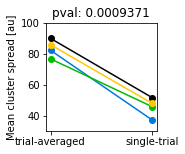

In [82]:
### 8) Compare spatial compactness of clusters, across mice

clust1 = 'full'
all_clust_spread = defaultdict(list)
# for d_id in [7, 11, 18, 19]:
for d_id in [7, 11, 18, 19]:#[7, 11, 18, 19]:
    sets = [{'method':'nmf', 'protocol':'full', 'randseed':1, 'n_components':n_components, 'l1':0.0},
            {'method':'nmf', 'protocol':'4way', 'randseed':1, 'n_components':n_components, 'l1':0.0},
           ]
    a_nmf = cu.load_clustering_results(d_id, sets, clustering_dir, protocol_as_key=True) 
    
    clust_spreads = cu.plot_cluster_spread_comparison(a_nmf, ['4way', 'full'],
                                                      min_clust_size=5, do_plot=False)
    
    all_clust_spread['full'].append(np.mean(clust_spreads['full']))
    all_clust_spread['4way'].append(np.mean(clust_spreads['4way']))

    plt.plot(np.arange(2), 
             [np.mean(clust_spreads['4way']), np.mean(clust_spreads['full'])], 
             'o-', label=d_id, 
             color=mouse_colors[np.where(np.array(datasets)==int(d_id))[0][0]])
    plt.xticks(np.arange(2), ['trial-averaged', 'single-trial'])
    
    print("4way: {}, full: {}".format(np.mean(clust_spreads['4way']), 
                                      np.mean(clust_spreads['full'])))
    
t, p1 = scipy.stats.ttest_rel(all_clust_spread['4way'], all_clust_spread['full'])
plt.title('pval: {:.7f}'.format(p1))
plt.ylim([30, 100])
plt.ylabel('Mean cluster spread [au]')
# plt.xlim([-.5, 2.5])
savename = 'mean_cluster_spread.pdf'
plt.gcf().set_size_inches(w=2, h=2) # Control size of figure in inches
plt.savefig(os.path.join(cluster_figs_dir, 'avg_plots', savename), 
            transparent=True, rasterized=True, dpi=600) 

In [ ]:
### 9) Compare clusters with covariates TODO TODO

In [ ]:
### Load motion behavior data
do_compare_with_covariates = False
if do_compare_with_covariates:
    lower_camera_path = os.path.join(dataset['data_root'], 
                               dataset['date'],
                               dataset['name'],
                               dataset['date'] + '-' +
                               dataset['name'] 
                               + '_lower_camera_trial_regressors.pkl')

    import pickle
    with open(lower_camera_path, 'rb') as f:
        lower_camera_data = pickle.load(f)

False
(655, 564, 25)
Saving to /home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/11/example_clust_traces/21/Clusters/d11c21/contours_d11c21_1_0.png
---Plotting contours: 2.785829544067383 seconds ---
False
(655, 564, 25)
Saving to /home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/11/example_clust_traces/21/Clusters/d11c21/contours_d11c21_2_0.png
---Plotting contours: 2.128929615020752 seconds ---
False
(655, 564, 25)
Saving to /home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/11/example_clust_traces/21/Clusters/d11c21/contours_d11c21_3_0.png
---Plotting contours: 1.6016247272491455 seconds ---
True
(655, 564, 25)
Saving to /home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/11/example_clust_traces/21/Clusters/d11c21/contours_d11c21_5_1.png
---Plotting contours: 14.713191509246826 seconds ---


/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


False
(655, 564, 12)
Saving to /home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/11/example_clust_traces/5/Clusters/d11c5/contours_d11c5_1_0.png
---Plotting contours: 1.6716880798339844 seconds ---
False
(655, 564, 12)
Saving to /home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/11/example_clust_traces/5/Clusters/d11c5/contours_d11c5_2_0.png
---Plotting contours: 1.2223923206329346 seconds ---
False
(655, 564, 12)
Saving to /home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/11/example_clust_traces/5/Clusters/d11c5/contours_d11c5_3_0.png
---Plotting contours: 1.8706116676330566 seconds ---
True
(655, 564, 12)
Saving to /home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/11/example_clust_traces/5/Clusters/d11c5/contours_d11c5_5_1.png
---Plotting contours: 3.737851619720459 seconds ---
False
(655, 564, 8)
Saving to /home/izkula/Dropbox//cosmos/fig_plots/fig7/avg_plots_40/11/example_clust_traces/32/Clusters/d11c32/contours_d11c32_1_0.png
---Plotting contours: 1.4844

OSError: [Errno 12] Cannot allocate memory

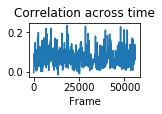

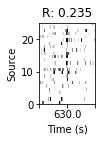

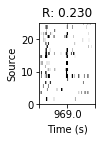

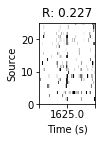

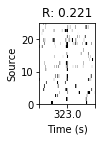

...

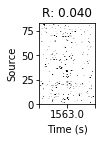

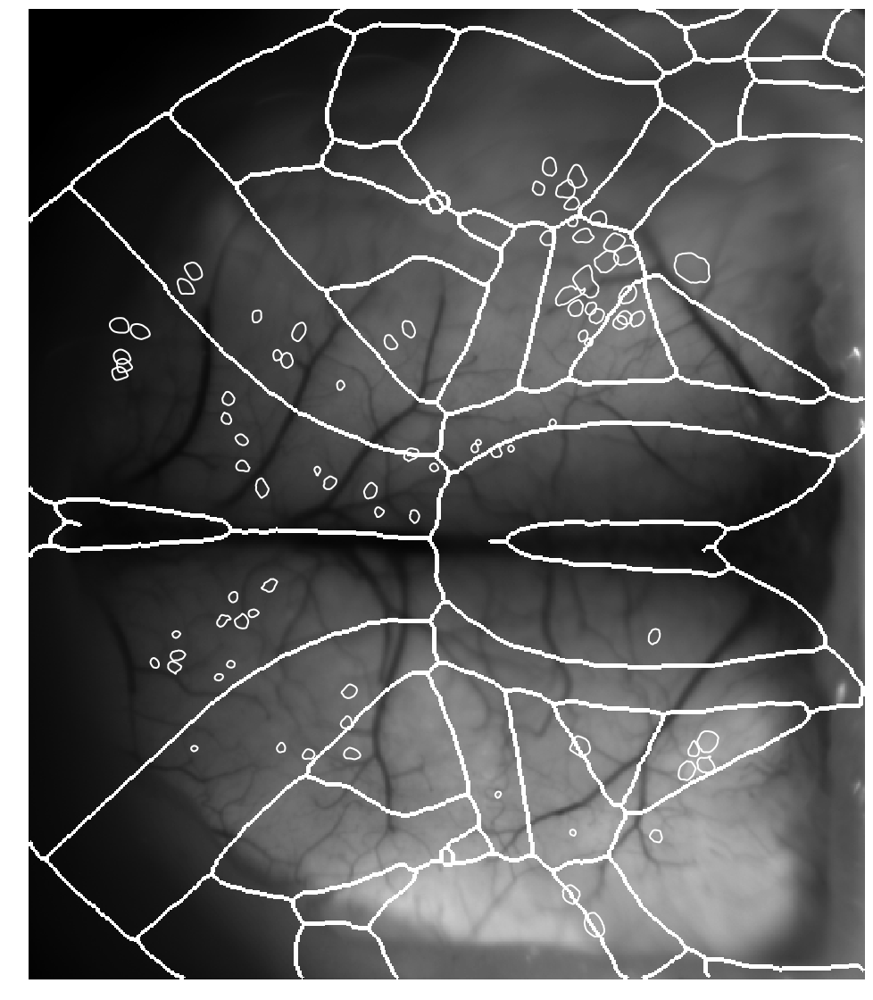

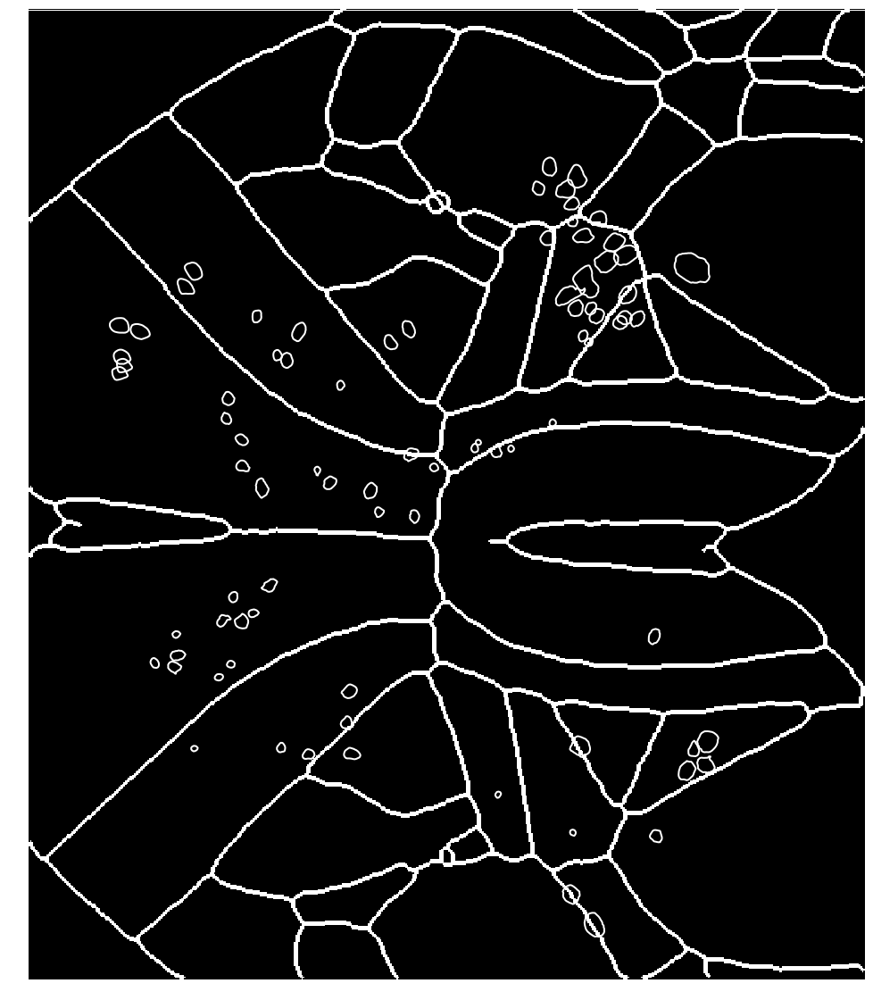

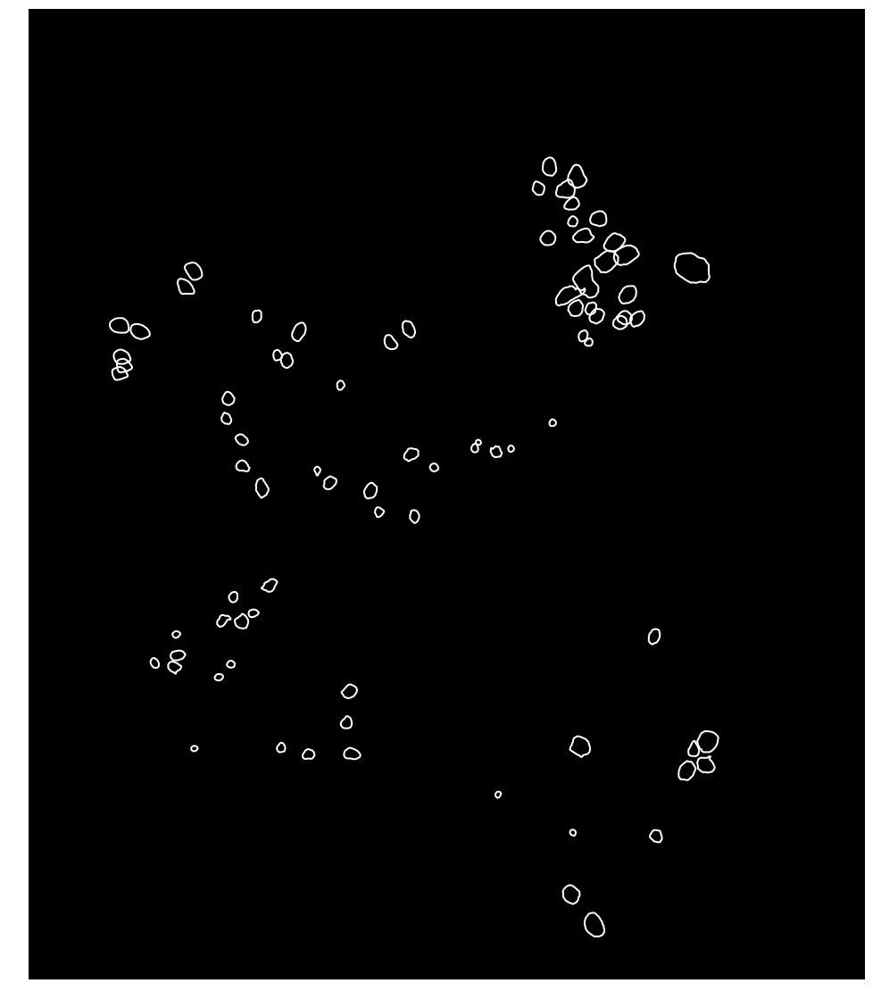

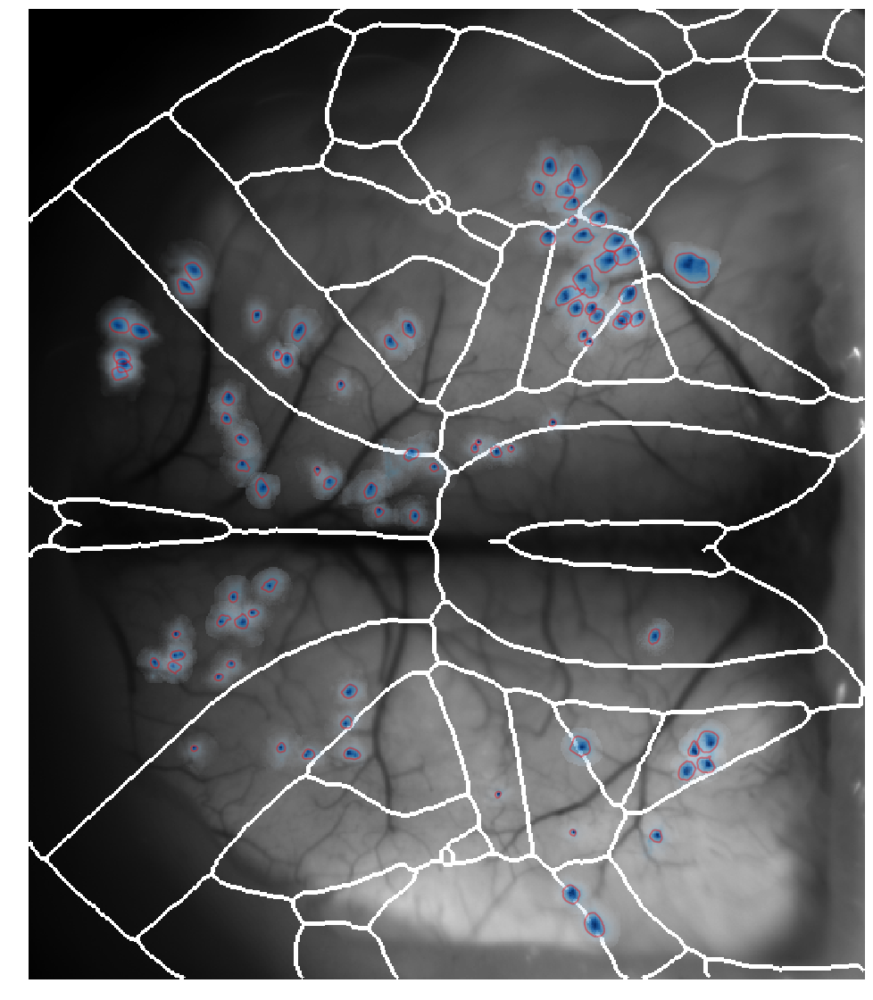

In [96]:
### 10) Plot example coactive sources in a cluster and saveout corresponding contours
###     for overlaying on video in imagej (align with Plugins->Landmarks->Name Landmarks and Register)
if dataset_id == 7:
    pass
elif dataset_id == 11:
    if n_components == 50:
        which_clust = 23 #23 #31 #8 #14
    elif n_components == 40:
        which_clusts = [21, 5, 32, 28, 12, 18, 15] #5 #32 #28 # 12 #21
elif dataset_id == 18:
    pass
elif dataset_id == 19:
    pass

CT = allCT[np.where(np.array(datasets)==int(dataset_id))[0][0]]
smoothS = gaussian_filter1d(CT.S, 1.5, axis=1, mode='constant')

for which_clust in which_clusts:
    clustering = all_nmf['full']['ordered_clustering']
    which_cells = np.where(clustering == which_clust)[0]


    savedir = os.path.join(clust_fig_dir, 'example_clust_traces', str(which_clust))
    cu.plot_high_correlation_timepoints(smoothS, which_cells, savedir)
    
    ### Plot contours of sources in cluster for overlaying on video (and finding
    ### video clips to match the high_correlation_timepoint plots).
    for which_base_im in [1, 2, 3, 5]:
        coords = cu.plot_cluster_contours(CT, which_cells, 
                                 which_base_im=which_base_im, 
                                 name='d' + str(dataset_id) + 'c' + str(which_clust), 
                                 fig_save_path=savedir,
                                 just_show_highlighted=True,
                                 show_footprints=False,
                                 edge_color=(1,1,1,1))

In [ ]:
a

### Make overlay plots of the clusters (local and global). 

In [134]:
### 111) Compare nmf with different random seeds. For dataset 11?
sets = [{'method':'nmf', 'protocol':'full', 'randseed':1, 'n_components':n_components, 'l1':0.0},
        {'method':'nmf', 'protocol':'full', 'randseed':2, 'n_components':n_components, 'l1':0.0},
        {'method':'nmf', 'protocol':'full', 'randseed':3, 'n_components':n_components, 'l1':0.0},
        {'method':'nmf', 'protocol':'4way', 'randseed':1, 'n_components':n_components, 'l1':0.0},
        {'method':'nmf', 'protocol':'4way', 'randseed':2, 'n_components':n_components, 'l1':0.0},
        {'method':'nmf', 'protocol':'4way', 'randseed':3, 'n_components':n_components, 'l1':0.0},
       ]
    
nmf_comparison = cu.load_clustering_results(dataset_id, sets, clustering_dir)

Done loading: 11
Done loading: 11
Done loading: 11
Done loading: 11
Done loading: 11
Done loading: 11


[5, 12, 28, 24, 21, 23, 32]
[3, 9, 26, 22, 19, 8, 32]
[4, 11, 32, 24, 21, 23, 31]


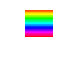

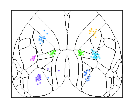

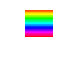

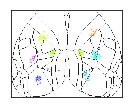

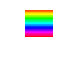

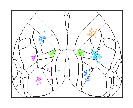

In [141]:
# 111a) Plot overlaid local clusters for comparing different nmf parameters
clust1 = 'full'
for i in [0, 1, 2]:
    randseed = sets[i]['randseed']
    nmf_color = nmf_comparison[i]
    centroid_coloring = cu.assign_colors_to_sources(nmf_color['ordered_clustering'], 
                                                    nmf_color['ordered_super_clustering'],
                                                    cmap='hsv')

    nmf_centroid = nmf_comparison[i]
    centroids_to_plot = nmf_centroid['centroid_atlas_coords'][:, :]

    median_cluster_spread_full, _ = cu.compute_cluster_spread(nmf_comparison[clust1]['ordered_clustering'], 
                                                              nmf_comparison[clust1]['centroid_atlas_coords'])
    specific_clusters = None
    if clust1 == 'full':
        if dataset_id == 11:
            if n_components == 50:
                if randseed == 1:
                    specific_clusters = [14, 31, 5, 8, 43, 38, 29]
                elif randseed == 2:
                     specific_clusters = [1, 31, 27, 5, 42, 43, 15]
                elif randseed == 3:
                     specific_clusters = [12, 30, 25, 4, 43, 37, 28]
            elif n_components == 40:
                if randseed == 1:
                    specific_clusters = [5, 12, 28, 24, 21, 23, 32]
                elif randseed == 2:
                     specific_clusters = [3,9,26,22,19,8,32]#[1, 31, 27, 5, 42, 43, 15]
                elif randseed == 3:
                     specific_clusters = [4, 11, 32, 24, 21, 23, 31]#[12, 30, 25, 4, 43, 37, 28]                
                
        elif dataset_id == 7:
            pass
#             specific_clusters = [8, 24, 15, 32, 36, 0] # 25, 39? 0?
        elif dataset_id == 18:
            pass
#             specific_clusters = [11, 14, 18, 34,  10] #7? 16?
        elif dataset_id == 19:
            pass
#             specific_clusters = [8, 10, 24, 35, 48, 40, 19] #1? 18?, 16? 28?, 20? 33?
    elif clust1 == 'baseline':
         if dataset_id == 11:
            specific_clusters = [7, 18, 27, 32, 42, 36, 0] # Also 0, 19, 23, 48? 24
            specific_clusters = [0, 7, 19, 32, 42, 36, 24] # Also 0, 19, 23, 48? 24

    # specific_clusters = None
    # specific_clusters = None

    cu.plot_cluster_spatial_maps(centroid_coloring, 
                                 nmf_centroid['ordered_clustering'], 
                                 centroids_to_plot,
    #                              radius=2, 
                                 radius=1.5,#1.5, #1.5#10,
                                 background_color=np.array([0.9, 0.9, 0.9, 0.0]),
                                 do_overlay=True,
                                 specific_clusters = specific_clusters,
                                 ncols=2) 

    savename = ('id'+str(dataset_id)+'_'+protocol+'_example_'+clust1
               +'_clusts_'+'rand_'+str(sets[i]['randseed'])+'.pdf')
    plt.gcf().set_size_inches(w=2, h=2) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 

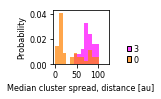

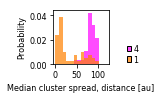

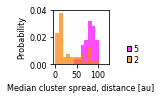

In [68]:
# 111a) Quantify and compare locality of clusters for different NMF random seeds.

nrand = 3
for i in range(nrand):
    plt.figure()
    
    clust_spreads = cu.plot_cluster_spread_comparison(nmf_comparison, [i+nrand, i],
                                                      min_clust_size=5, do_plot=True)
    
    savename = ('id'+str(dataset_id)+'_'+str(sets[i]['protocol'])+'_randseed_'
                + str(sets[i]['randseed'])+'_clust_spread_comparison.pdf')
    plt.gcf().set_size_inches(w=1, h=1) # Control size of figure in inches
    plt.savefig(os.path.join(clust_fig_dir, savename), 
                transparent=True, rasterized=True, dpi=600) 

Done loading: 11
Done loading: 11


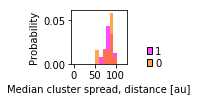

In [132]:
### 112) Plot result of clustering randomly permuted time series.
sets = [{'method':'nmf', 'protocol':'rand_full', 'randseed':1, 'n_components':n_components, 'l1':0.0},
        {'method':'nmf', 'protocol':'rand_4way', 'randseed':1, 'n_components':n_components, 'l1':0.0},
       ]

nmf_rand = cu.load_clustering_results(dataset_id, sets, clustering_dir)

clust_spreads = cu.plot_cluster_spread_comparison(nmf_rand, [1, 0],
                                                  min_clust_size=5, do_plot=True)

savename = 'id'+str(dataset_id)+'_'+str(sets[0]['protocol'])+str(clust1)+'_clust_spread_comparison.pdf'
plt.gcf().set_size_inches(w=1, h=1) # Control size of figure in inches
plt.savefig(os.path.join(clust_fig_dir, savename), 
            transparent=True, rasterized=True, dpi=600) 

In [ ]:
#113) Plot justOdor clustering

In [302]:
nmf_justOdor[0].keys()

dict_keys(['ordered_super_clustering', 'Z', 'ordering', 'trial_names', 'evr', 'clustering', 'super_clust_info', 'W', 'W_trial', 'corr_coef', 'trial_set_inds', 'trial_sets', 'centroid_atlas_coords', 'H', 'ordered_clustering'])

Done loading: 25
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]


/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)


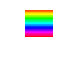

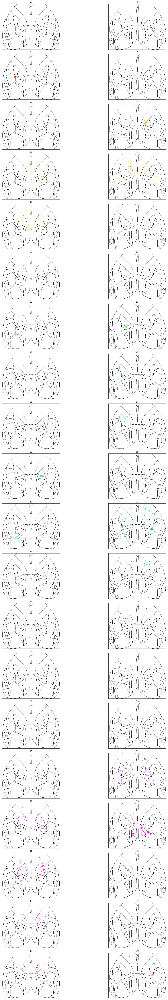

In [324]:
#113) Plot justOdor clustering
for d_id in [25]: #[30, 31]:
    sets = [{'method':'nmf', 'protocol':'full', 'randseed':1, 'n_components':n_components, 'l1':0.0},
           ]

    nmf_justOdor = cu.load_clustering_results(d_id, sets, clustering_dir)
    
    i = 0
    
    ### Plot overlaid local clusters for comparing different nmf parameters
    clust1 = 'full'
    randseed = sets[i]['randseed']
    nmf_color = nmf_justOdor[i]
    centroid_coloring = cu.assign_colors_to_sources(nmf_color['ordered_clustering'], 
                                                    nmf_color['ordered_super_clustering'],
                                                    cmap='hsv')

    nmf_centroid = nmf_justOdor[i]
    centroids_to_plot = nmf_centroid['centroid_atlas_coords'][:, :]

    median_cluster_spread_full, _ = cu.compute_cluster_spread(nmf_justOdor[i]['ordered_clustering'], 
                                                              nmf_justOdor[i]['centroid_atlas_coords'])
    specific_clusters = None
    if clust1 == 'full':
        if d_id == 30:
            if n_components == 40:
                if randseed == 1:     
                    specific_clusters = [3, 28, 11, 14]
        elif d_id == 31:
            if n_components == 40:
                if randseed == 1:     
                    specific_clusters = [14, 22, 18]
        elif d_id == 25:
            if n_components == 40:
                if randseed == 1:     
                    specific_clusters = [3, 37, 39, 26, 20, 17] #15?
            specific_clusters = None
        elif d_id == 24:
            if n_components == 40:
                if randseed == 1:     
                    specific_clusters = [7, 33, 37, 12, 27 ] #15? --- 22
            specific_clusters = None
        elif d_id == 11:
            specific_cluster = None # --- 24
 
    cu.plot_cluster_spatial_maps(centroid_coloring, 
                                 nmf_centroid['ordered_clustering'], 
                                 centroids_to_plot,
    #                              radius=2, 
                                 radius=10, #1.5,#1.5,#1.5, #1.5#10,
                                 background_color=np.array([0.9, 0.9, 0.9, 0.0]),
                                 do_overlay=False,
                                 specific_clusters = specific_clusters,
                                 ncols=2) 

#     savename = ('id'+str(d_id)+'_'+protocol+'_example_'+clust1
#                +'_clusts_'+'rand_'+str(randseed)+'.pdf')
#     plt.gcf().set_size_inches(w=2, h=2) # Control size of figure in inches
#     plt.savefig(os.path.join(clust_fig_dir, savename), 
#                 transparent=True, rasterized=True, dpi=600) 

### Sillhouette analysis plotting

In [201]:
### 211) Why did you choose 40 clusters? 
all_sill = {}

In [202]:
all_sill

{}

7
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt7_r1_n10_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt7_r1_n20_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt7_r1_n30_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt7_r1_n40_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt7_r1_n50_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt7_r1_n60_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt7_r1_n70_l0.0.pkl
0
1
2
3
4
5
6
-264.7387328147888
11
Loading: 
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt11_r1_n10_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt11_r1_n20_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt11_r1_n30_l0.0.pkl
/home/izkula/Dropbox//cosmos_data/clustering_results/nmf_full_expt11_r1_n40_l0.0.pkl
/home/izkula/D

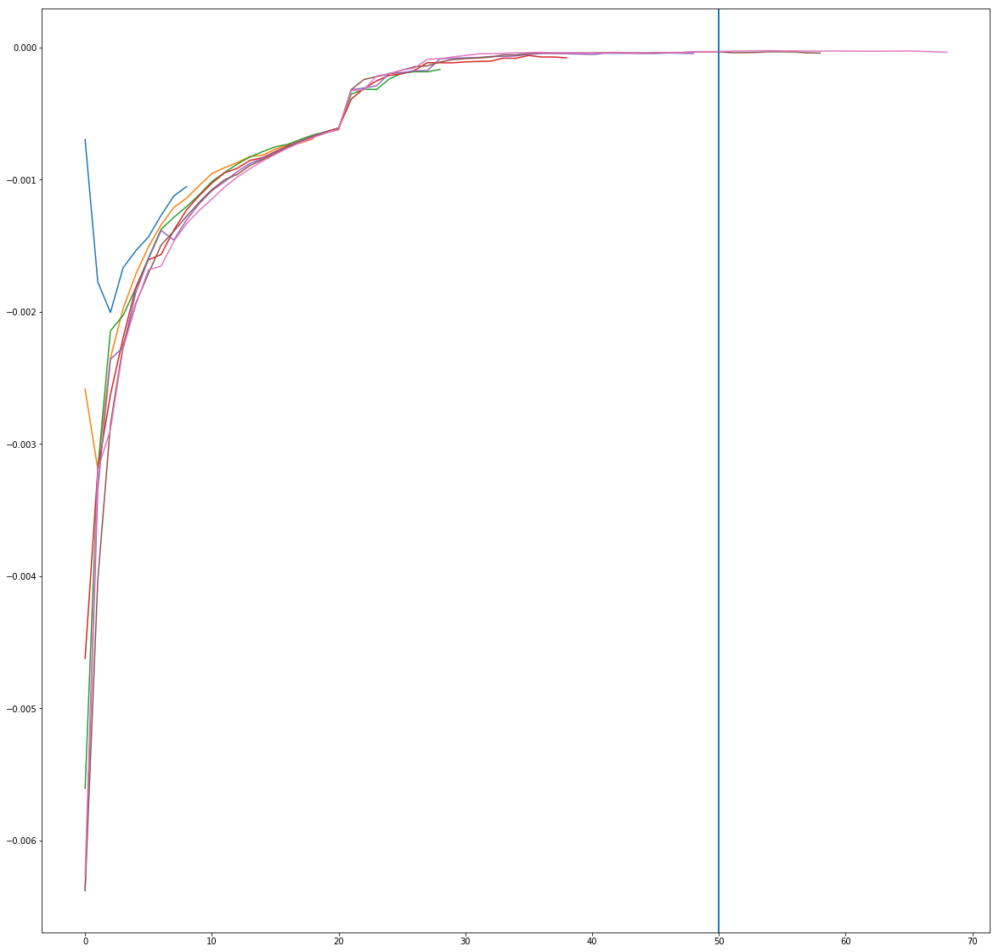

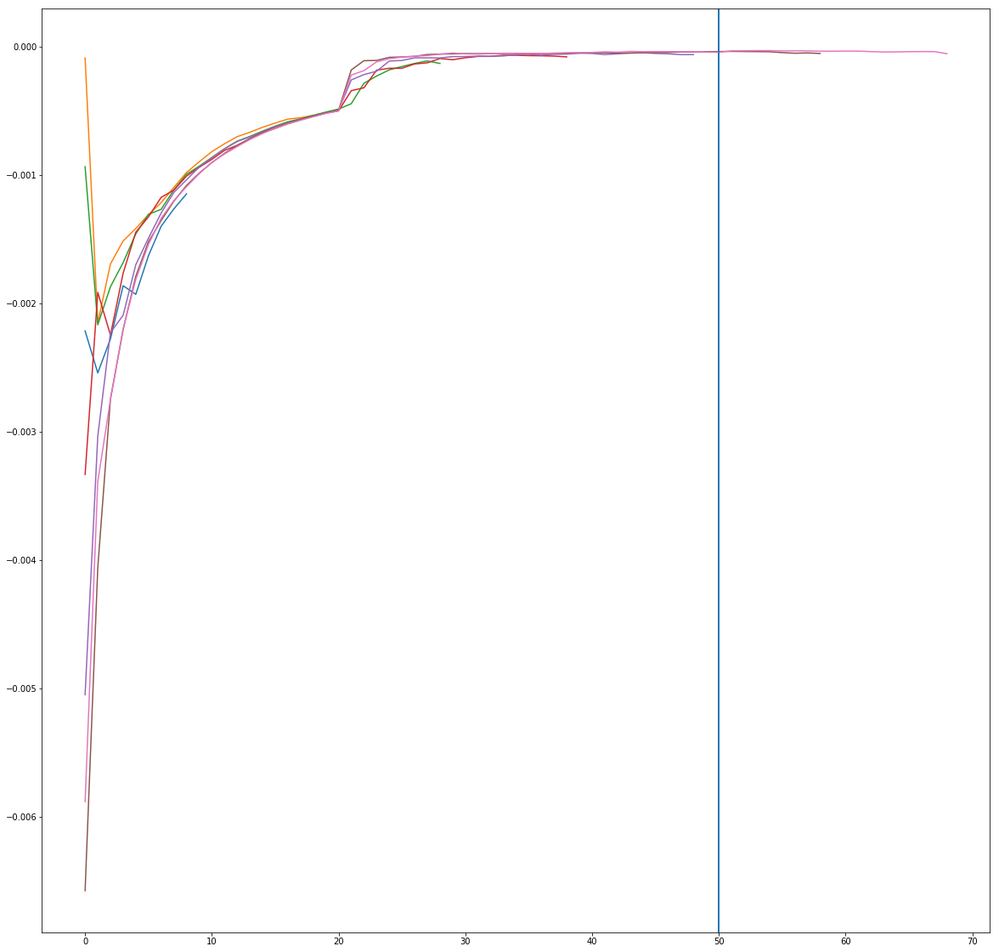

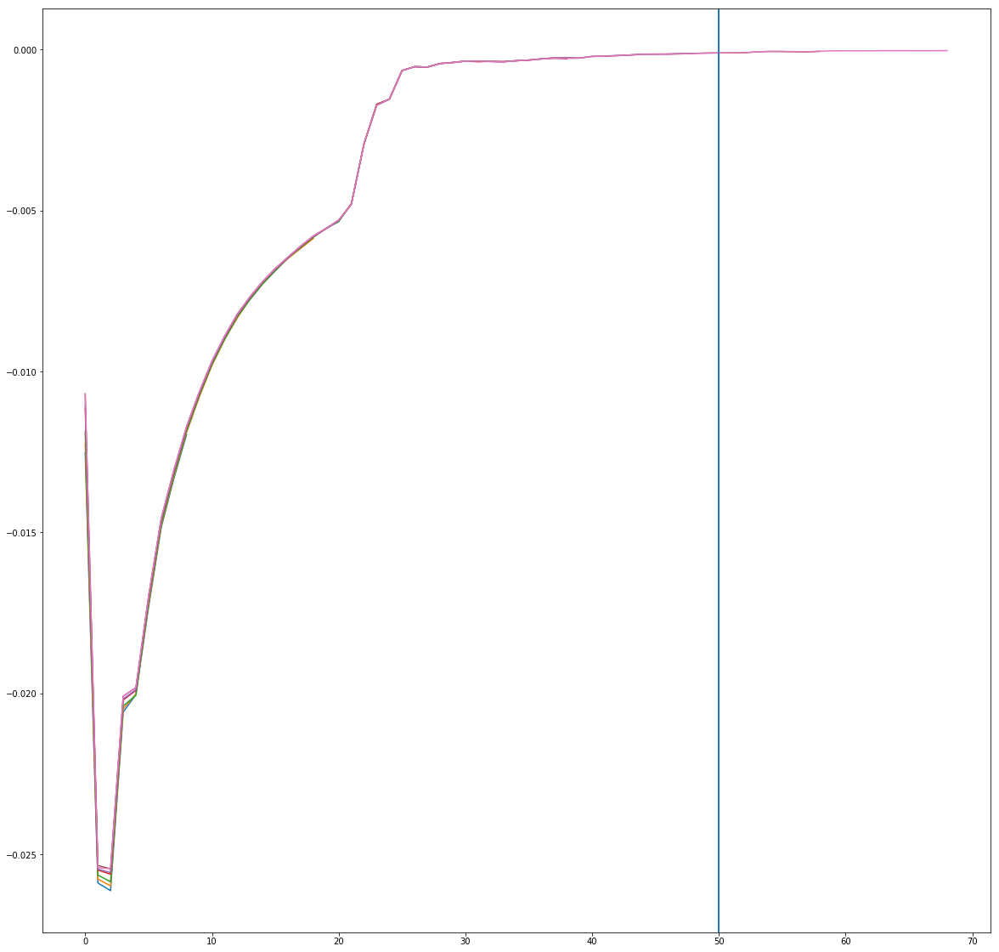

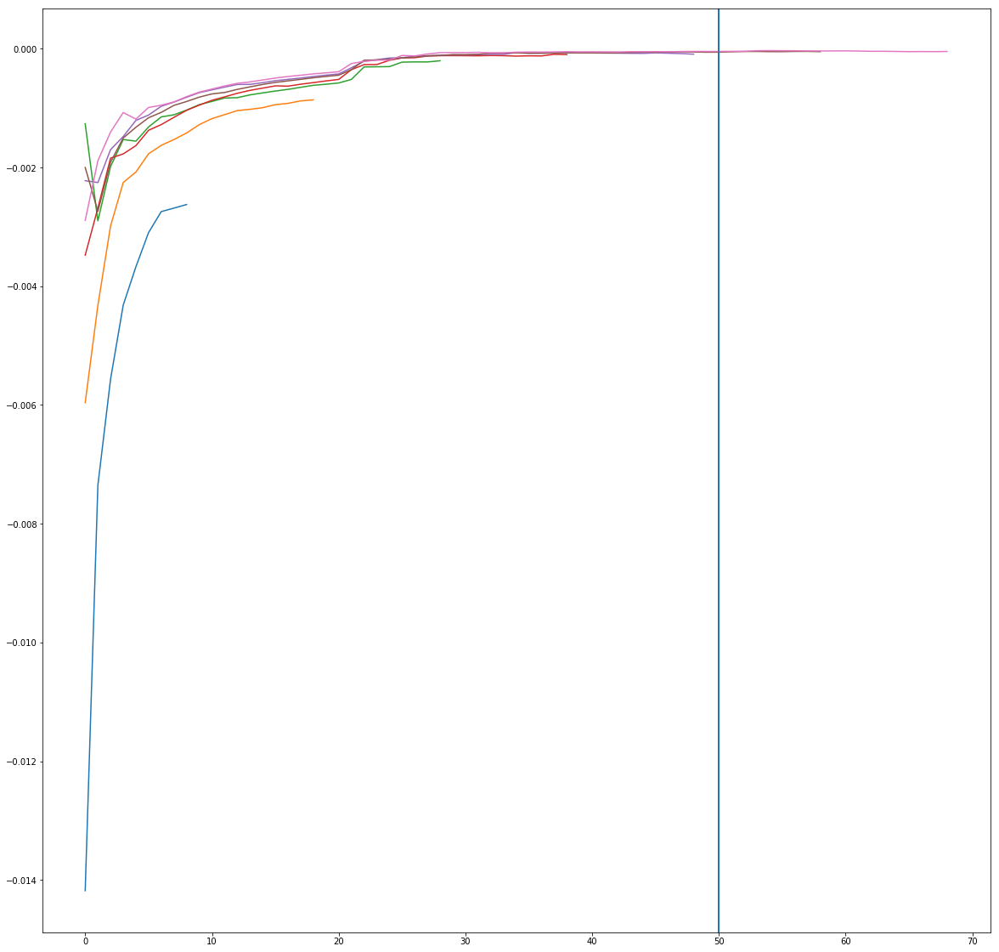

In [203]:
### 211a) Computing sillhouette score

which_protocol = 'full'
# which_protocol = '4way'

t0 = time.time()
for dataset_id in [7, 11, 18, 19]: #[7, 11, 18, 19, 38]: 
# for dataset_id in [18]:
    sets = [
            ### Testing the smaller values for 4way since k=10 seemed to be the winner...
#             {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':2, 'l1':0.0},
#             {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':3, 'l1':0.0},
#             {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':4, 'l1':0.0},
#             {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':5, 'l1':0.0},
#             {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':6, 'l1':0.0},
#             {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':7, 'l1':0.0},
#             {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':8, 'l1':0.0},
#             {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':9, 'l1':0.0},
        
            {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':10, 'l1':0.0},
            {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':20, 'l1':0.0},
            {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':30, 'l1':0.0},
            {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':40, 'l1':0.0},
            {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':50, 'l1':0.0},
            {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':60, 'l1':0.0},
            {'method':'nmf', 'protocol':which_protocol, 'randseed':1, 'n_components':70, 'l1':0.0},
#             {'method':'nmf', 'protocol':'full', 'randseed':1, 'n_components':90, 'l1':0.0},
    #         {'method':'nmf', 'protocol':'full', 'randseed':1, 'n_components':110, 'l1':0.0},
           ]
    
    
    
    
    print(dataset_id)

    nmf_ranks = cu.load_clustering_results(dataset_id, sets, clustering_dir)

    plt.figure(figsize=(20, 20))
    for i in range(len(sets)):
        ev = nmf_ranks[i]['evr']
        plt.plot(utils.moving_avg(np.diff(ev[np.argsort(-ev)])))
    #     plt.plot(ev[np.argsort(-ev)])
        plt.axvline(50)

    CT_ind = np.where(np.array(datasets) == dataset_id)[0][0]
    rates = gaussian_filter1d(allCT[CT_ind].St, 1.5, axis=1, mode='constant')
    
    ### Should I binarize for the silhouette score? 
    
    rates_flat = np.reshape(rates, (rates.shape[0], rates.shape[1]*rates.shape[2]), order='F')

    ### Compute sillhouette score (takes a little while)
    import sklearn.metrics as metrics
    ranks = []
    sill_samples = []
    for i in range(len(sets)):
        print(i)
        ranks.append(sets[i]['n_components'])
        clustering = nmf_ranks[i]['ordered_clustering']
        s_samples = metrics.silhouette_samples(rates_flat, clustering, metric='correlation')
        sill_samples.append(s_samples)
    all_sill[dataset_id] = sill_samples
    print(t0 - time.time())

In [204]:
all_sill.keys()

dict_keys([19, 18, 11, 7])

In [205]:
### 211c) Save out.

import pickle
with open(os.path.join(cluster_figs_dir, 'avg_plots', 'sillh_{}.pkl'.format(which_protocol)), 'wb') as handle:
    pickle.dump(all_sill, handle)

In [206]:
### Load in. 

import pickle
with open(os.path.join(cluster_figs_dir, 'avg_plots', 'sillh_{}.pkl'.format(which_protocol)), 'rb') as handle:
    loaded_sill = pickle.load(handle)

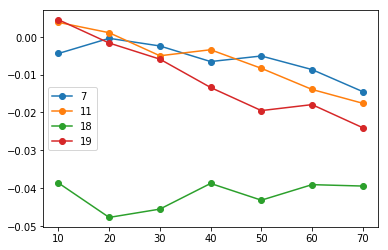

In [208]:
### 211b)
sill_means = []
for key in [7, 11, 18, 19]: #, 38]:
    sill_samples = loaded_sill[key]
    sill_mean = np.mean(np.vstack(sill_samples), axis=1)[:len(ranks)]
    plt.plot(ranks, sill_mean, 'o-', label=key)
    sill_means.append(sill_mean)
plt.legend()

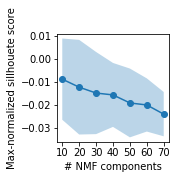

In [209]:
### 211d)

sill_means = np.vstack(sill_means)
# sill_means /= np.max(sill_means, axis=1)[:, np.newaxis]
m = np.mean(np.vstack(sill_means), axis=0)[:]
x = ranks[:]
s = np.std(np.vstack(sill_means), axis=0)[:]
# sill_means /= sill_means[:, 2][:, np.newaxis]
plt.plot(x, m, '-o')
plt.fill_between(x, m+s,m-s, alpha=0.3)
plt.xlabel('# NMF components')
plt.ylabel('Max-normalized sillhouete score')
plt.xticks(ranks[:])
savename = 'normalized_sillhouette_comparison_{}.pdf'.format(which_protocol)
plt.gcf().set_size_inches(w=2, h=2) # Control size of figure in inches
plt.savefig(os.path.join(cluster_figs_dir, 'avg_plots', savename), 
            transparent=True, rasterized=True, dpi=600) 

In [52]:
cluster_figs_dir

'/home/izkula/Dropbox//cosmos/fig_plots/fig7/'

In [212]:
CT.St.shape

(1401, 205, 200)

(<matplotlib.image.AxesImage at 0x7f7dd71e87b8>,
 <matplotlib.colorbar.Colorbar at 0x7f7dd7207b70>)

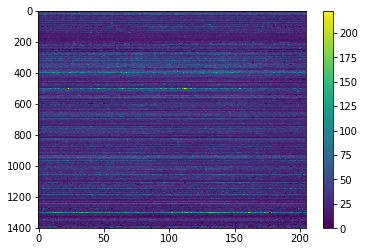

In [214]:
plt.imshow(np.max(CT.St, axis=2), aspect='auto'), plt.colorbar()

In [ ]:
scipy.stats.ttest_ind(sill_means[:, 3], sill_means[:, 6])

### Investigations of individual clusters (for the supplement)


Done loading: 18
True
(694, 583, 8)
---Plotting contours: 0.3740053176879883 seconds ---
Done loading: 19
True
(665, 576, 28)
---Plotting contours: 1.2189948558807373 seconds ---


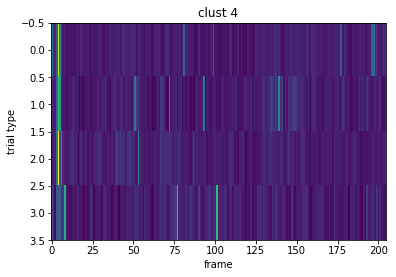

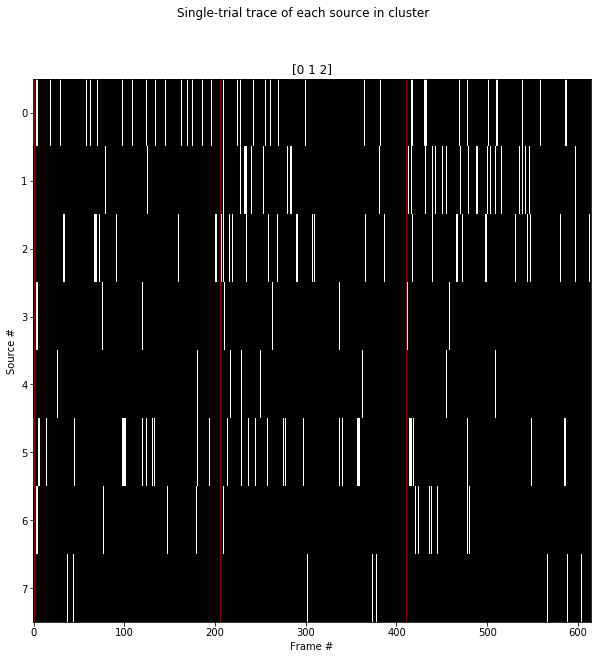

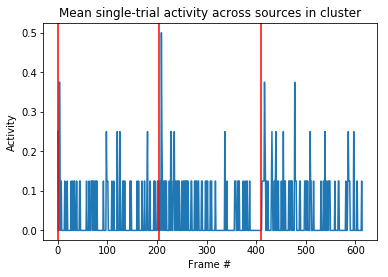

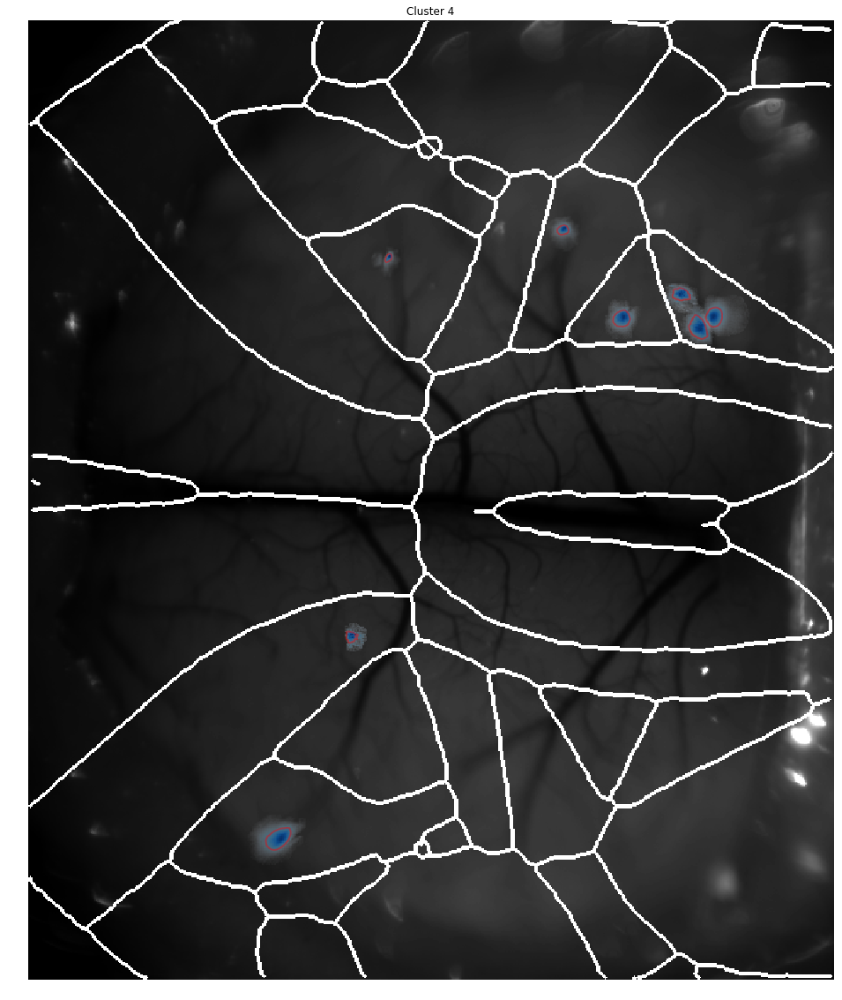

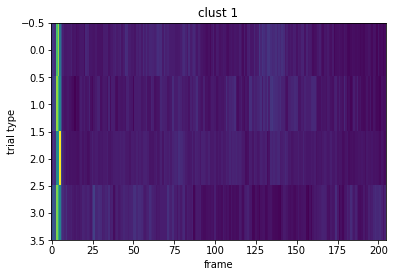

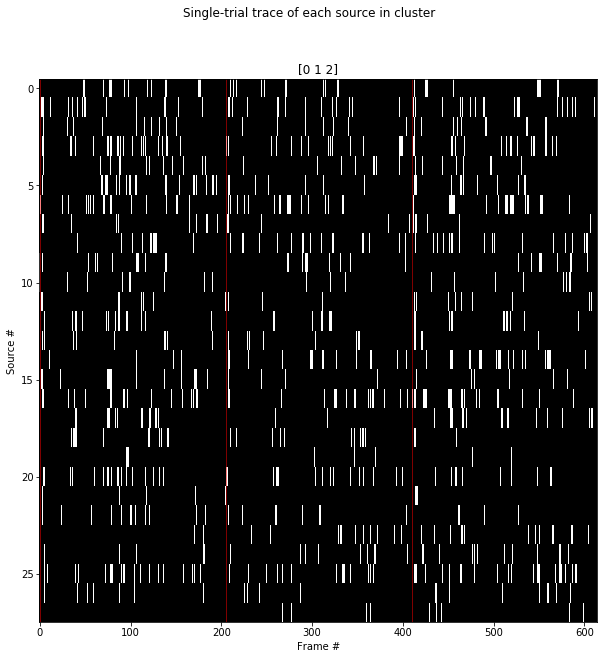

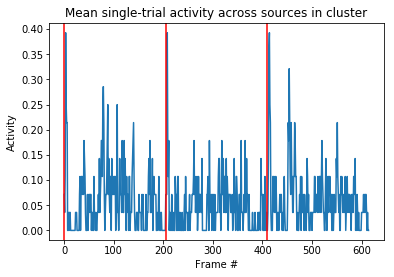

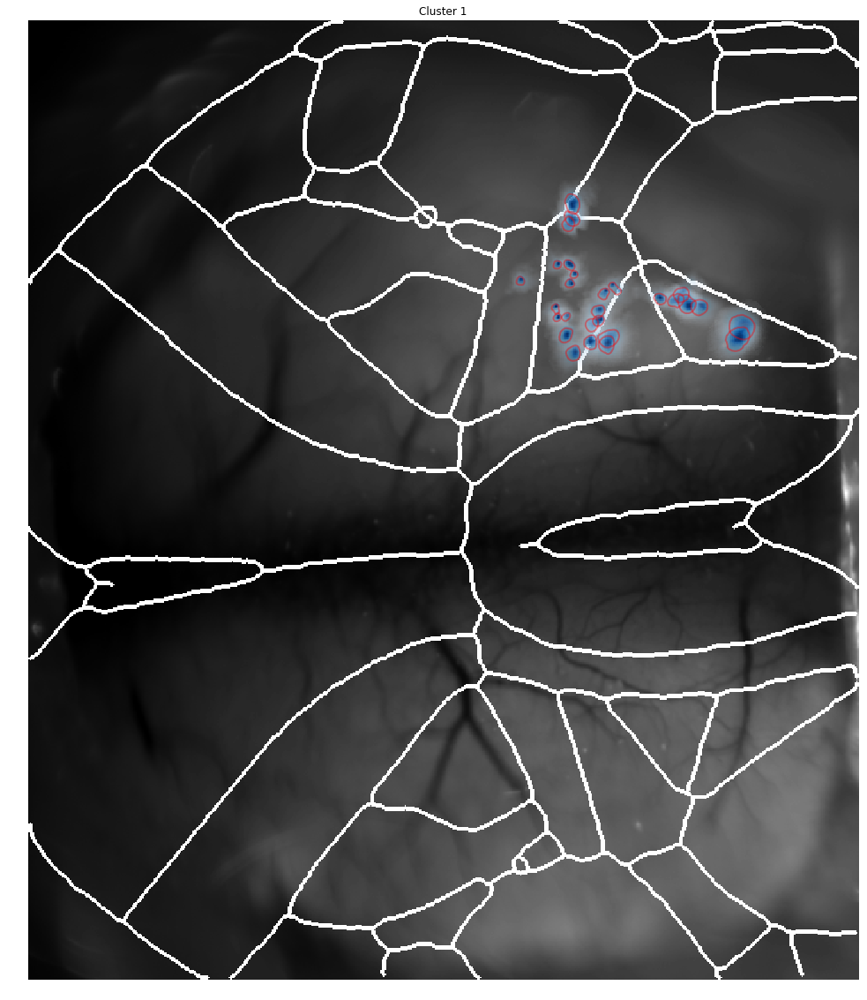

In [210]:
### 311) Plot out specific cases of clusters

specific_cases = [{'dataset_id': 18, 'which_clust': 4, 'clustering': 'ordered_clustering',
                  'method':'nmf', 'protocol':'4way', 'randseed':1, 'n_components':40, 'l1':0.0,
                  'info': 'Green LED responsive cluster.'},
                {'dataset_id': 19, 'which_clust': 1, 'clustering': 'ordered_clustering',
                  'method':'nmf', 'protocol':'4way', 'randseed':1, 'n_components':40, 'l1':0.0,
                  'info':'Green LED responsive cluster.'}]


for s in special_cases:
        
    ### Load the nmf results
    nmf_specific = cu.load_clustering_results(s['dataset_id'], [s], clustering_dir)

    CT_ind = np.where(np.array(datasets) == s['dataset_id'])[0][0]
    CT = allCT[CT_ind]
    
    trial_sets = nmf_specific[0]['trial_sets']
    clustering = nmf_specific[0][s['clustering']]
    cu.summarize_individual_cluster(s['which_clust'], CT, clustering, trial_sets)

### Save colorbars

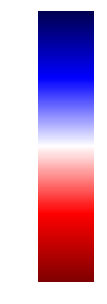

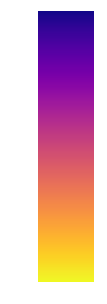

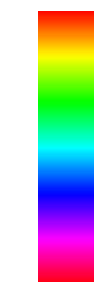

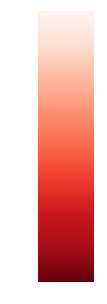

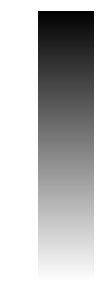

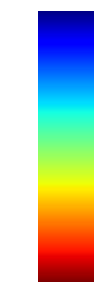

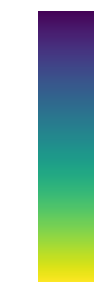

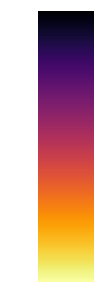

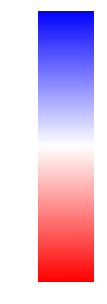

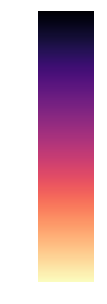

In [74]:
### 20) Saveout colorbars
colorbar_dir = base_dir + '/cosmos/fig_plots/colorbars/'
if not os.path.isdir(colorbar_dir):
    os.makedirs(colorbar_dir)
    

cms = {'seismic': plt.cm.seismic,
      'bwr':plt.cm.bwr,
      'jet':plt.cm.jet,
      'hsv': plt.cm.hsv,
      'viridis':plt.cm.viridis,
      'gray':plt.cm.gray,
      'inferno':plt.cm.inferno,
      'magma':plt.cm.magma,
      'Reds':plt.cm.Reds,
      'plasma':plt.cm.plasma}

for key, val in cms.items():
    plt.figure(figsize=(1,5))
    plt.imshow(np.arange(10000).reshape((-1,1))-5000,aspect='auto',interpolation='none',cmap=val)
    plt.axis('off')
    plt.savefig(colorbar_dir + key+ '.png',dpi=400,bbox_inches='tight')

### Legacy code below